In [1]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import easydict

In [2]:
manualSeed = 999
random.seed(manualSeed)
torch.manual_seed(manualSeed)

In [3]:
args = easydict.EasyDict({
    "dataroot":"/mnt/gold/users/s18150/mywork/pytorch/data/gan",
    "workers": 8,
    "batch_size": 128,
    "image_size": 64,
    "nc": 3,
    "nz": 100,
    "ngf": 64,
    "ndf": 64,
    "epochs": 5,
    "lr": 0.0002,
    "beta1": 0.5,
    "gpu": 8,
})

In [4]:
transform = transforms.Compose([
    transforms.Resize(args.image_size),
    transforms.CenterCrop(args.image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))    
])

In [5]:
dataset = dataset.ImageFolder(root=args.dataroot,transform=transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=args.batch_size,
                                        shuffle=True, num_workers=args.workers)


In [6]:
device = torch.device('cuda:{}'.format(args.gpu) if (torch.cuda.is_available() and args.gpu > 0) else 'cpu')

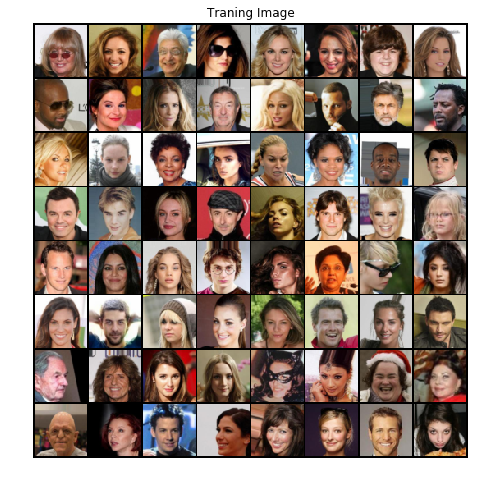

In [7]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis('off')
plt.title('Traning Image')
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64],
                       padding=2,normalize=True).cpu(),(1,2,0)))

In [8]:
# モデルの初期化用の関数
# DCGANによるとCNN層の初期値は、平均0、偏差0.2で乱数初期化
# BatchNormの部分が何故平均1になっているかは調査が必要

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [9]:
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
#         self.gpu = args.gpu

##upsampleinで得られる画像サイズ = (W - 1) x stride - 2xpadding + kernel + outputpadding

        self.model = nn.Sequential(
            # 乱数z, generatorのconv層への入力
            # 層の深さ ngfx8, kernel: 4, stride: 1, padding: 0
            # サイズ: (1-1)x 1 - 2x0 + 4 = 4
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),
            # 層の深さ ngfx4, kernel: 4, stride: 2, padding: 1
            # サイズ: (4-1)x 2 - 2x1 + 4 = 8
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),
            # 層の深さ ngfx2, kernel: 4, stride: 2, padding: 1
            # サイズ: (8-1)x 2 - 2x1 + 4 = 16
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            # 層の深さ ngfx2, kernel: 4, stride: 2, padding: 1
            # サイズ: (16-1)x 2 - 2x1 + 4 = 32
            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # 層の深さ ngfx2, kernel: 4, stride: 2, padding: 1
            # サイズ: (32-1)x 2 - 2x1 + 4 = 64
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )
    
    def forward(self, input):
        return self.model(input)

In [10]:
## Generator用のモデルのインスタンス作成
netG = Generator(args.nz, args.ngf, args.nc).to(device)
## Generator用のモデルの初期値を設定
netG.apply(weights_init)

Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [11]:
class Discriminator(nn.Module):
    def __init__(self, nc, ndf):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            # SIZE = (W + 2xpadding - kernel) / stride + 1      
            # nc x 64 x 64 >> (64 + 2x1 - 4)/2 +1 = 32
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf) x 32 x 32 >> (32 + 2x1 - 4)/2 +1 = 16
            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf) x 16 x 16 >> (16 + 2x1 - 4)/2 +1 = 8
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*4),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf) x 8 x 8 >> (8 + 2x1 - 4)/2 +1 = 4
            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf) x 4 x 4 >> (4 + 2x0 - 4)/1 +1 = 1 >> 1つの値を出力
            nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        
        )
        
    def forward(self, input):
        return self.model(input)
    

In [12]:
## Discriminator用のモデルのインスタンス作成
netD = Discriminator(args.nc, args.ndf).to(device)
## Discriminator用のモデルの初期値を設定
netD.apply(weights_init)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

loss関数としてnn.BCELoss()を使用  
BCELoss()の中身は下記  
$loss(x,y) = L = {l_1, ..., l_N}$  
$l_n = -w_n [y_n \cdot \log x_n + (1 - y_n) \cdot \log(1 - x_n)]$  
$loss(x,y) = mean(L)$, if size_average = True  
$loss(x,y) = sum(L)$, if size_average = False  
$w_n$: weight parameter

In [1]:
# BCE Loss classのインスタンスを作成
criterion = nn.BCELoss()

# Generatorに入力するノイズをバッチごとに作成 (バッチ数は64)
# これはGeneratorの結果を描画するために使用する
fixed_noise = torch.randn(64, args.nz, 1, 1, device=device)

# real dataとface dataのラベルを作成
real_label = 1
fake_label = 0

# 最適化関数のインスタンスを作成
optimizerD = optim.Adam(netD.parameters(), lr=args.lr, betas=(args.beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=args.lr, betas=(args.beta1, 0.999))


NameError: name 'nn' is not defined

In [16]:
img_list = []
G_losses = []
D_losses = []
iters = 0

for epoch in range(args.epochs):
    for i, data in enumerate(dataloader, 0):
        
        netD.zero_grad()
        real_data = data[0].to(device)
        batch_size = real_data.size(0)
        ''' <https://github.com/soumith/ganhacks によると、
        real dataとfakeデータを個別に学習する方が精度がよいとの検証結果があるため、
        このコードもその検証結果をフォローする'''
        
        ################# Discriminator の real dataを学習 #####################
        # real data の正解ラベルのベクトル をバッチサイズ分用意
        # 長さ batch size のベクトルをreal_label = 1 で埋める
        label = torch.full((batch_size,), real_label, device=device)
        # Discriminator のreal dataのforwardを計算
        output = netD(real_data).view(-1)
        # Discriminator の real dataのlossを計算
        # cross entropy = -y log x - (1 - y) log(1 -x)
        # label はすべて1に設定しているため、fake dataのloss を表す２項目はすべて0になる
        errD_real = criterion(output, label)
        errD_real.backward()
        # Discriminatorの出力値の平均、ナッシュ均衡点は0.5
        D_x = output.mean().item()
        
        ################# Discriminator の fake dataを学習 #####################
        noise = torch.randn(batch_size, args.nz, 1, 1, device=device)
        # args.nzの長さの乱数のベクトルをGeneratorのネットワークに入力
        fake_data = netG(noise)
        # labelをすべてfake_labelで埋める、batch sizeはreal と fakeで同じサイズを前提
        label.fill_(fake_label)
        # Discriminator の fake data のforwardを計算
        # このときGeneratorは学習しないため、fake_dataのrequired_gradをすべてfalseにする
        output = netD(fake_data.detach()).view(-1)
        # Discriminator の fake dataのlossを計算
        # cross entropy = -y log x - (1 - y) log(1 -x)
        # label はすべて0に設定しているため、fake dataのloss を表す1項目はすべて0になる
        errD_fake = criterion(output, label)
        errD_fake.backward()
        # Discriminatorの出力値の平均、ナッシュ均衡点は0.5
        D_G_z1 = output.mean().item()
        # Discriminatorのloss
        errD = errD_real - errD_fake
        # netDのパラメータを更新
        optimizerD.step()
        
        ################# Generator の fake dataを学習 #####################
        netG.zero_grad()
        # Generatorの場合、Discriminatorを騙すため、ラベルはすべて1(正解)で設定する
        # その時の log(D(G(z)))を最大化することがGeneratorの目的
        label.fill_(real_label)
        # 今度はfake_dataをdetachしない
        output = netD(fake_data).view(-1)
        # Generatorのlossを計算、Generatorの目的は (1 - log(D(G(z))))を最小化すること
        # しかし通常勾配消失が生じてうまく学習できない
        # そのため、log()D(G(z))を最大化することを目的とする
        # そのため、labelを1にセットし、cross entropy の第一項を使用する
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        # netGのパラメータを更新
        optimizerG.step()
        
        if i % 50:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, args.epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))        
        
        # ロスを保存
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (iters % 500 == 0) or ((epoch == args.epochs - 1) and (i == len(dataloader) - 1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
        
        iters += 1
        

[0/5][1/1583]	Loss_D: 0.0051	Loss_G: 2.1290	D(x): 0.7392	D(G(z)): 0.2582 / 0.1448
[0/5][2/1583]	Loss_D: -0.0718	Loss_G: 2.4300	D(x): 0.7620	D(G(z)): 0.2876 / 0.1049
[0/5][3/1583]	Loss_D: 0.1074	Loss_G: 2.0290	D(x): 0.6887	D(G(z)): 0.2515 / 0.1514
[0/5][4/1583]	Loss_D: 0.0181	Loss_G: 2.1551	D(x): 0.7606	D(G(z)): 0.2244 / 0.1499
[0/5][5/1583]	Loss_D: -0.2422	Loss_G: 3.1444	D(x): 0.8003	D(G(z)): 0.3547 / 0.0538
[0/5][6/1583]	Loss_D: 0.6440	Loss_G: 0.8342	D(x): 0.5000	D(G(z)): 0.1187 / 0.4815
[0/5][7/1583]	Loss_D: -1.0911	Loss_G: 4.6435	D(x): 0.9387	D(G(z)): 0.6476 / 0.0137
[0/5][8/1583]	Loss_D: 1.3054	Loss_G: 0.6208	D(x): 0.3190	D(G(z)): 0.0296 / 0.5801
[0/5][9/1583]	Loss_D: -1.5696	Loss_G: 5.4257	D(x): 0.9677	D(G(z)): 0.7467 / 0.0073
[0/5][10/1583]	Loss_D: 1.4479	Loss_G: 0.2530	D(x): 0.2766	D(G(z)): 0.0214 / 0.8042
[0/5][11/1583]	Loss_D: -2.2385	Loss_G: 6.7138	D(x): 0.9828	D(G(z)): 0.8679 / 0.0020
[0/5][12/1583]	Loss_D: 2.2213	Loss_G: 1.3086	D(x): 0.1582	D(G(z)): 0.0095 / 0.3445
[0/5][13

[0/5][104/1583]	Loss_D: -1.5533	Loss_G: 4.2479	D(x): 0.9677	D(G(z)): 0.7396 / 0.0251
[0/5][105/1583]	Loss_D: 0.9611	Loss_G: 1.3532	D(x): 0.4149	D(G(z)): 0.0654 / 0.3109
[0/5][106/1583]	Loss_D: -0.5393	Loss_G: 2.3908	D(x): 0.8377	D(G(z)): 0.4668 / 0.1163
[0/5][107/1583]	Loss_D: -0.1050	Loss_G: 2.9492	D(x): 0.7565	D(G(z)): 0.3064 / 0.0681
[0/5][108/1583]	Loss_D: 0.4905	Loss_G: 1.4488	D(x): 0.5568	D(G(z)): 0.1437 / 0.2723
[0/5][109/1583]	Loss_D: -0.4937	Loss_G: 3.3115	D(x): 0.8690	D(G(z)): 0.4419 / 0.0477
[0/5][110/1583]	Loss_D: 0.2914	Loss_G: 2.1635	D(x): 0.6367	D(G(z)): 0.1868 / 0.1361
[0/5][111/1583]	Loss_D: 0.0398	Loss_G: 1.8082	D(x): 0.7187	D(G(z)): 0.2596 / 0.1878
[0/5][112/1583]	Loss_D: -0.3283	Loss_G: 3.1030	D(x): 0.7898	D(G(z)): 0.4089 / 0.0587
[0/5][113/1583]	Loss_D: 0.4608	Loss_G: 1.5552	D(x): 0.5851	D(G(z)): 0.1230 / 0.2465
[0/5][114/1583]	Loss_D: -0.5048	Loss_G: 3.3589	D(x): 0.8593	D(G(z)): 0.4505 / 0.0442
[0/5][115/1583]	Loss_D: 0.1894	Loss_G: 2.6472	D(x): 0.7117	D(G(z)): 0.

[0/5][204/1583]	Loss_D: -0.1887	Loss_G: 2.2084	D(x): 0.8506	D(G(z)): 0.2826 / 0.1390
[0/5][205/1583]	Loss_D: -0.2576	Loss_G: 3.6158	D(x): 0.8536	D(G(z)): 0.3237 / 0.0330
[0/5][206/1583]	Loss_D: 0.2053	Loss_G: 2.7353	D(x): 0.7612	D(G(z)): 0.0780 / 0.0843
[0/5][207/1583]	Loss_D: 0.2008	Loss_G: 1.3879	D(x): 0.6757	D(G(z)): 0.2017 / 0.2902
[0/5][208/1583]	Loss_D: -0.3264	Loss_G: 3.2176	D(x): 0.8885	D(G(z)): 0.3380 / 0.0499
[0/5][209/1583]	Loss_D: 0.1861	Loss_G: 2.1801	D(x): 0.6787	D(G(z)): 0.2034 / 0.1359
[0/5][210/1583]	Loss_D: -0.0452	Loss_G: 2.4875	D(x): 0.8107	D(G(z)): 0.2241 / 0.0987
[0/5][211/1583]	Loss_D: 0.0046	Loss_G: 2.3227	D(x): 0.7464	D(G(z)): 0.2486 / 0.1226
[0/5][212/1583]	Loss_D: 0.0182	Loss_G: 2.0610	D(x): 0.7249	D(G(z)): 0.2671 / 0.1454
[0/5][213/1583]	Loss_D: -0.1920	Loss_G: 3.1455	D(x): 0.8390	D(G(z)): 0.2992 / 0.0533
[0/5][214/1583]	Loss_D: 0.3967	Loss_G: 1.5284	D(x): 0.6159	D(G(z)): 0.1327 / 0.2607
[0/5][215/1583]	Loss_D: -0.3576	Loss_G: 3.2889	D(x): 0.8892	D(G(z)): 0.

[0/5][304/1583]	Loss_D: 0.3999	Loss_G: 1.7579	D(x): 0.6050	D(G(z)): 0.1380 / 0.2101
[0/5][305/1583]	Loss_D: -0.2623	Loss_G: 3.0044	D(x): 0.8515	D(G(z)): 0.3334 / 0.0593
[0/5][306/1583]	Loss_D: 0.3199	Loss_G: 1.8597	D(x): 0.6615	D(G(z)): 0.1246 / 0.1864
[0/5][307/1583]	Loss_D: -0.2195	Loss_G: 2.6905	D(x): 0.8216	D(G(z)): 0.3243 / 0.0841
[0/5][308/1583]	Loss_D: 0.1674	Loss_G: 1.8848	D(x): 0.6745	D(G(z)): 0.2203 / 0.1764
[0/5][309/1583]	Loss_D: -0.1297	Loss_G: 2.4516	D(x): 0.7810	D(G(z)): 0.3052 / 0.1060
[0/5][310/1583]	Loss_D: -0.0737	Loss_G: 2.8683	D(x): 0.7845	D(G(z)): 0.2600 / 0.0776
[0/5][311/1583]	Loss_D: 0.3879	Loss_G: 1.2269	D(x): 0.6082	D(G(z)): 0.1442 / 0.3325
[0/5][312/1583]	Loss_D: -0.7452	Loss_G: 4.4778	D(x): 0.8984	D(G(z)): 0.5283 / 0.0162
[0/5][313/1583]	Loss_D: 1.1725	Loss_G: 0.6492	D(x): 0.3535	D(G(z)): 0.0399 / 0.5622
[0/5][314/1583]	Loss_D: -1.1550	Loss_G: 4.5034	D(x): 0.9566	D(G(z)): 0.6405 / 0.0176
[0/5][315/1583]	Loss_D: 0.8286	Loss_G: 0.4945	D(x): 0.4644	D(G(z)): 0.

[0/5][404/1583]	Loss_D: -0.3846	Loss_G: 3.2086	D(x): 0.8924	D(G(z)): 0.3675 / 0.0492
[0/5][405/1583]	Loss_D: 0.3405	Loss_G: 1.7429	D(x): 0.6473	D(G(z)): 0.1263 / 0.2084
[0/5][406/1583]	Loss_D: -0.3592	Loss_G: 3.2634	D(x): 0.8380	D(G(z)): 0.3853 / 0.0467
[0/5][407/1583]	Loss_D: 0.3453	Loss_G: 1.8797	D(x): 0.6637	D(G(z)): 0.1061 / 0.1823
[0/5][408/1583]	Loss_D: -0.3486	Loss_G: 3.3424	D(x): 0.8621	D(G(z)): 0.3639 / 0.0453
[0/5][409/1583]	Loss_D: 0.4269	Loss_G: 1.4507	D(x): 0.6260	D(G(z)): 0.0885 / 0.2807
[0/5][410/1583]	Loss_D: -0.5818	Loss_G: 3.9670	D(x): 0.9220	D(G(z)): 0.4497 / 0.0254
[0/5][411/1583]	Loss_D: 0.4937	Loss_G: 1.8764	D(x): 0.5965	D(G(z)): 0.0771 / 0.1919
[0/5][412/1583]	Loss_D: -0.2670	Loss_G: 2.6837	D(x): 0.8729	D(G(z)): 0.3127 / 0.0836
[0/5][413/1583]	Loss_D: 0.0130	Loss_G: 2.7653	D(x): 0.7902	D(G(z)): 0.1973 / 0.0773
[0/5][414/1583]	Loss_D: 0.2233	Loss_G: 1.6721	D(x): 0.6711	D(G(z)): 0.1766 / 0.2269
[0/5][415/1583]	Loss_D: -0.2414	Loss_G: 2.7360	D(x): 0.8190	D(G(z)): 0.

[0/5][504/1583]	Loss_D: 0.0104	Loss_G: 2.4184	D(x): 0.7433	D(G(z)): 0.2612 / 0.1073
[0/5][505/1583]	Loss_D: -0.0081	Loss_G: 2.7634	D(x): 0.8101	D(G(z)): 0.2003 / 0.0780
[0/5][506/1583]	Loss_D: 0.1812	Loss_G: 1.9125	D(x): 0.7491	D(G(z)): 0.1221 / 0.1816
[0/5][507/1583]	Loss_D: -0.2451	Loss_G: 3.1087	D(x): 0.8340	D(G(z)): 0.3259 / 0.0554
[0/5][508/1583]	Loss_D: 0.0781	Loss_G: 2.8472	D(x): 0.8145	D(G(z)): 0.1287 / 0.0744
[0/5][509/1583]	Loss_D: 0.1576	Loss_G: 1.6710	D(x): 0.7267	D(G(z)): 0.1637 / 0.2218
[0/5][510/1583]	Loss_D: -0.4310	Loss_G: 3.7471	D(x): 0.8802	D(G(z)): 0.3989 / 0.0289
[0/5][511/1583]	Loss_D: 0.6360	Loss_G: 1.2268	D(x): 0.5352	D(G(z)): 0.0685 / 0.3326
[0/5][512/1583]	Loss_D: -0.5939	Loss_G: 3.7813	D(x): 0.9270	D(G(z)): 0.4602 / 0.0278
[0/5][513/1583]	Loss_D: 0.2669	Loss_G: 2.4263	D(x): 0.6958	D(G(z)): 0.1228 / 0.1131
[0/5][514/1583]	Loss_D: 0.2833	Loss_G: 1.0703	D(x): 0.6619	D(G(z)): 0.1576 / 0.3833
[0/5][515/1583]	Loss_D: -0.8399	Loss_G: 4.9664	D(x): 0.9489	D(G(z)): 0.5

[0/5][604/1583]	Loss_D: -0.5130	Loss_G: 3.1126	D(x): 0.8681	D(G(z)): 0.4486 / 0.0571
[0/5][605/1583]	Loss_D: 0.2104	Loss_G: 2.3790	D(x): 0.6971	D(G(z)): 0.1606 / 0.1165
[0/5][606/1583]	Loss_D: -0.0535	Loss_G: 2.4411	D(x): 0.8107	D(G(z)): 0.2314 / 0.1098
[0/5][607/1583]	Loss_D: -0.0397	Loss_G: 2.5161	D(x): 0.7897	D(G(z)): 0.2422 / 0.1000
[0/5][608/1583]	Loss_D: 0.1064	Loss_G: 2.1862	D(x): 0.7501	D(G(z)): 0.1757 / 0.1414
[0/5][609/1583]	Loss_D: -0.1365	Loss_G: 2.5430	D(x): 0.8033	D(G(z)): 0.2901 / 0.0971
[0/5][610/1583]	Loss_D: 0.0709	Loss_G: 2.4501	D(x): 0.7714	D(G(z)): 0.1856 / 0.1009
[0/5][611/1583]	Loss_D: 0.0365	Loss_G: 2.1827	D(x): 0.7272	D(G(z)): 0.2516 / 0.1389
[0/5][612/1583]	Loss_D: -0.0060	Loss_G: 2.3652	D(x): 0.7896	D(G(z)): 0.2136 / 0.1169
[0/5][613/1583]	Loss_D: -0.1805	Loss_G: 3.1526	D(x): 0.8317	D(G(z)): 0.2982 / 0.0537
[0/5][614/1583]	Loss_D: 0.5442	Loss_G: 1.0493	D(x): 0.5424	D(G(z)): 0.1125 / 0.3779
[0/5][615/1583]	Loss_D: -0.6593	Loss_G: 3.7026	D(x): 0.9233	D(G(z)): 0

[0/5][704/1583]	Loss_D: 0.0597	Loss_G: 1.9665	D(x): 0.7390	D(G(z)): 0.2263 / 0.1665
[0/5][705/1583]	Loss_D: -0.0792	Loss_G: 2.4182	D(x): 0.7313	D(G(z)): 0.3183 / 0.1115
[0/5][706/1583]	Loss_D: -0.1442	Loss_G: 3.2753	D(x): 0.8183	D(G(z)): 0.2772 / 0.0484
[0/5][707/1583]	Loss_D: 0.6430	Loss_G: 1.0469	D(x): 0.5144	D(G(z)): 0.1104 / 0.4073
[0/5][708/1583]	Loss_D: -1.0634	Loss_G: 4.7279	D(x): 0.9346	D(G(z)): 0.6395 / 0.0133
[0/5][709/1583]	Loss_D: 0.9551	Loss_G: 1.6657	D(x): 0.4343	D(G(z)): 0.0401 / 0.2422
[0/5][710/1583]	Loss_D: -0.4514	Loss_G: 3.2331	D(x): 0.8946	D(G(z)): 0.4067 / 0.0508
[0/5][711/1583]	Loss_D: 0.2209	Loss_G: 2.2100	D(x): 0.7083	D(G(z)): 0.1491 / 0.1328
[0/5][712/1583]	Loss_D: 0.0772	Loss_G: 1.7302	D(x): 0.7174	D(G(z)): 0.2424 / 0.2074
[0/5][713/1583]	Loss_D: -0.3194	Loss_G: 3.2618	D(x): 0.8434	D(G(z)): 0.3525 / 0.0475
[0/5][714/1583]	Loss_D: 0.3592	Loss_G: 1.8759	D(x): 0.6412	D(G(z)): 0.1335 / 0.1846
[0/5][715/1583]	Loss_D: -0.3380	Loss_G: 3.1333	D(x): 0.8793	D(G(z)): 0.

[0/5][804/1583]	Loss_D: -0.5464	Loss_G: 4.3731	D(x): 0.8877	D(G(z)): 0.4504 / 0.0186
[0/5][805/1583]	Loss_D: 0.7745	Loss_G: 1.2797	D(x): 0.4839	D(G(z)): 0.0664 / 0.3326
[0/5][806/1583]	Loss_D: -0.5749	Loss_G: 3.9527	D(x): 0.9000	D(G(z)): 0.4461 / 0.0266
[0/5][807/1583]	Loss_D: 0.5329	Loss_G: 1.6360	D(x): 0.5820	D(G(z)): 0.0659 / 0.2414
[0/5][808/1583]	Loss_D: -0.6182	Loss_G: 4.1393	D(x): 0.9298	D(G(z)): 0.4556 / 0.0218
[0/5][809/1583]	Loss_D: 0.4813	Loss_G: 1.8975	D(x): 0.6007	D(G(z)): 0.0835 / 0.1855
[0/5][810/1583]	Loss_D: -0.2271	Loss_G: 2.7996	D(x): 0.8576	D(G(z)): 0.3076 / 0.0737
[0/5][811/1583]	Loss_D: 0.0641	Loss_G: 2.5068	D(x): 0.7717	D(G(z)): 0.1797 / 0.1015
[0/5][812/1583]	Loss_D: -0.0303	Loss_G: 2.5151	D(x): 0.8060	D(G(z)): 0.2214 / 0.0976
[0/5][813/1583]	Loss_D: 0.2202	Loss_G: 1.4269	D(x): 0.6725	D(G(z)): 0.1856 / 0.2722
[0/5][814/1583]	Loss_D: -0.5654	Loss_G: 4.2098	D(x): 0.8826	D(G(z)): 0.4549 / 0.0205
[0/5][815/1583]	Loss_D: 0.7215	Loss_G: 1.4034	D(x): 0.4912	D(G(z)): 0.

[0/5][904/1583]	Loss_D: -0.0510	Loss_G: 2.7087	D(x): 0.8124	D(G(z)): 0.2267 / 0.0843
[0/5][905/1583]	Loss_D: 0.2367	Loss_G: 1.3444	D(x): 0.6920	D(G(z)): 0.1354 / 0.2966
[0/5][906/1583]	Loss_D: -0.5861	Loss_G: 5.0660	D(x): 0.9324	D(G(z)): 0.4489 / 0.0086
[0/5][907/1583]	Loss_D: 0.9298	Loss_G: 0.9648	D(x): 0.4355	D(G(z)): 0.0307 / 0.4362
[0/5][908/1583]	Loss_D: -0.7800	Loss_G: 4.4580	D(x): 0.9598	D(G(z)): 0.5119 / 0.0160
[0/5][909/1583]	Loss_D: 0.4502	Loss_G: 2.0276	D(x): 0.6346	D(G(z)): 0.0610 / 0.1647
[0/5][910/1583]	Loss_D: -0.3183	Loss_G: 3.3010	D(x): 0.9224	D(G(z)): 0.3067 / 0.0480
[0/5][911/1583]	Loss_D: 0.2375	Loss_G: 2.1103	D(x): 0.6753	D(G(z)): 0.1698 / 0.1506
[0/5][912/1583]	Loss_D: -0.1604	Loss_G: 2.9974	D(x): 0.8057	D(G(z)): 0.3015 / 0.0627
[0/5][913/1583]	Loss_D: 0.0820	Loss_G: 2.5850	D(x): 0.7442	D(G(z)): 0.2044 / 0.0954
[0/5][914/1583]	Loss_D: 0.0948	Loss_G: 2.2704	D(x): 0.7689	D(G(z)): 0.1619 / 0.1325
[0/5][915/1583]	Loss_D: -0.4144	Loss_G: 4.3821	D(x): 0.8689	D(G(z)): 0.

[0/5][1004/1583]	Loss_D: -0.6309	Loss_G: 4.4545	D(x): 0.9485	D(G(z)): 0.4550 / 0.0150
[0/5][1005/1583]	Loss_D: 0.7979	Loss_G: 1.3241	D(x): 0.4770	D(G(z)): 0.0591 / 0.3097
[0/5][1006/1583]	Loss_D: -0.5975	Loss_G: 3.3938	D(x): 0.8393	D(G(z)): 0.5008 / 0.0438
[0/5][1007/1583]	Loss_D: 0.5037	Loss_G: 1.5347	D(x): 0.5805	D(G(z)): 0.0948 / 0.2714
[0/5][1008/1583]	Loss_D: -0.5518	Loss_G: 3.9400	D(x): 0.9324	D(G(z)): 0.4256 / 0.0269
[0/5][1009/1583]	Loss_D: 0.5957	Loss_G: 1.5310	D(x): 0.5434	D(G(z)): 0.1008 / 0.2600
[0/5][1010/1583]	Loss_D: -0.4466	Loss_G: 3.1225	D(x): 0.8805	D(G(z)): 0.4011 / 0.0563
[0/5][1011/1583]	Loss_D: 0.1842	Loss_G: 2.6103	D(x): 0.7451	D(G(z)): 0.1288 / 0.0918
[0/5][1012/1583]	Loss_D: 0.0727	Loss_G: 1.9034	D(x): 0.7482	D(G(z)): 0.2108 / 0.1691
[0/5][1013/1583]	Loss_D: -0.1766	Loss_G: 2.9202	D(x): 0.8594	D(G(z)): 0.2674 / 0.0660
[0/5][1014/1583]	Loss_D: 0.0553	Loss_G: 2.6513	D(x): 0.7862	D(G(z)): 0.1744 / 0.0899
[0/5][1015/1583]	Loss_D: 0.0124	Loss_G: 2.4482	D(x): 0.7682	

[0/5][1104/1583]	Loss_D: 0.1076	Loss_G: 2.0348	D(x): 0.7293	D(G(z)): 0.1973 / 0.1542
[0/5][1105/1583]	Loss_D: -0.2716	Loss_G: 3.2613	D(x): 0.8187	D(G(z)): 0.3465 / 0.0505
[0/5][1106/1583]	Loss_D: 0.2049	Loss_G: 2.2706	D(x): 0.7123	D(G(z)): 0.1502 / 0.1314
[0/5][1107/1583]	Loss_D: -0.0987	Loss_G: 2.8102	D(x): 0.8163	D(G(z)): 0.2556 / 0.0789
[0/5][1108/1583]	Loss_D: 0.1066	Loss_G: 2.2171	D(x): 0.7220	D(G(z)): 0.2083 / 0.1388
[0/5][1109/1583]	Loss_D: -0.1080	Loss_G: 2.7534	D(x): 0.7873	D(G(z)): 0.2866 / 0.0841
[0/5][1110/1583]	Loss_D: -0.0069	Loss_G: 2.6681	D(x): 0.7980	D(G(z)): 0.2109 / 0.0884
[0/5][1111/1583]	Loss_D: 0.1216	Loss_G: 1.9621	D(x): 0.7475	D(G(z)): 0.1728 / 0.1680
[0/5][1112/1583]	Loss_D: -0.3492	Loss_G: 3.7121	D(x): 0.8488	D(G(z)): 0.3653 / 0.0322
[0/5][1113/1583]	Loss_D: 0.4921	Loss_G: 1.4683	D(x): 0.5746	D(G(z)): 0.1318 / 0.2786
[0/5][1114/1583]	Loss_D: -0.3749	Loss_G: 3.6150	D(x): 0.8745	D(G(z)): 0.3649 / 0.0367
[0/5][1115/1583]	Loss_D: 0.3335	Loss_G: 2.0703	D(x): 0.6637

[0/5][1204/1583]	Loss_D: 0.0924	Loss_G: 2.1957	D(x): 0.7112	D(G(z)): 0.2250 / 0.1316
[0/5][1205/1583]	Loss_D: -0.0559	Loss_G: 2.3990	D(x): 0.7531	D(G(z)): 0.2881 / 0.1134
[0/5][1206/1583]	Loss_D: 0.0179	Loss_G: 2.4033	D(x): 0.7762	D(G(z)): 0.2078 / 0.1101
[0/5][1207/1583]	Loss_D: 0.0108	Loss_G: 2.3565	D(x): 0.7872	D(G(z)): 0.2010 / 0.1213
[0/5][1208/1583]	Loss_D: -0.1696	Loss_G: 2.9463	D(x): 0.8121	D(G(z)): 0.2922 / 0.0688
[0/5][1209/1583]	Loss_D: 0.3847	Loss_G: 1.2920	D(x): 0.6053	D(G(z)): 0.1522 / 0.3219
[0/5][1210/1583]	Loss_D: -0.4815	Loss_G: 3.6005	D(x): 0.9102	D(G(z)): 0.4024 / 0.0375
[0/5][1211/1583]	Loss_D: 0.2267	Loss_G: 2.6097	D(x): 0.7303	D(G(z)): 0.1078 / 0.1027
[0/5][1212/1583]	Loss_D: 0.0276	Loss_G: 2.0427	D(x): 0.8056	D(G(z)): 0.1836 / 0.1554
[0/5][1213/1583]	Loss_D: -0.2458	Loss_G: 3.3406	D(x): 0.8557	D(G(z)): 0.3085 / 0.0459
[0/5][1214/1583]	Loss_D: 0.4517	Loss_G: 1.3587	D(x): 0.6000	D(G(z)): 0.1124 / 0.2998
[0/5][1215/1583]	Loss_D: -0.5129	Loss_G: 4.0259	D(x): 0.9195	

[0/5][1304/1583]	Loss_D: -0.3459	Loss_G: 3.4293	D(x): 0.8233	D(G(z)): 0.3805 / 0.0454
[0/5][1305/1583]	Loss_D: 0.5257	Loss_G: 1.3555	D(x): 0.5676	D(G(z)): 0.1007 / 0.2988
[0/5][1306/1583]	Loss_D: -0.7633	Loss_G: 4.7139	D(x): 0.9165	D(G(z)): 0.5303 / 0.0132
[0/5][1307/1583]	Loss_D: 1.0681	Loss_G: 1.2337	D(x): 0.3818	D(G(z)): 0.0597 / 0.3410
[0/5][1308/1583]	Loss_D: -0.5535	Loss_G: 3.0722	D(x): 0.9099	D(G(z)): 0.4418 / 0.0609
[0/5][1309/1583]	Loss_D: 0.1388	Loss_G: 2.7338	D(x): 0.7368	D(G(z)): 0.1664 / 0.0882
[0/5][1310/1583]	Loss_D: -0.0914	Loss_G: 2.5539	D(x): 0.7783	D(G(z)): 0.2837 / 0.1026
[0/5][1311/1583]	Loss_D: 0.1123	Loss_G: 2.2153	D(x): 0.7236	D(G(z)): 0.2019 / 0.1372
[0/5][1312/1583]	Loss_D: -0.1415	Loss_G: 2.6627	D(x): 0.7551	D(G(z)): 0.3299 / 0.0922
[0/5][1313/1583]	Loss_D: 0.0675	Loss_G: 2.2703	D(x): 0.6865	D(G(z)): 0.2812 / 0.1320
[0/5][1314/1583]	Loss_D: -0.0102	Loss_G: 2.4063	D(x): 0.7556	D(G(z)): 0.2492 / 0.1174
[0/5][1315/1583]	Loss_D: -0.0395	Loss_G: 2.6675	D(x): 0.778

[0/5][1404/1583]	Loss_D: -0.1362	Loss_G: 3.2499	D(x): 0.8478	D(G(z)): 0.2420 / 0.0494
[0/5][1405/1583]	Loss_D: 0.3784	Loss_G: 1.4179	D(x): 0.6234	D(G(z)): 0.1318 / 0.2844
[0/5][1406/1583]	Loss_D: -0.6016	Loss_G: 4.2196	D(x): 0.8878	D(G(z)): 0.4657 / 0.0232
[0/5][1407/1583]	Loss_D: 0.6017	Loss_G: 1.6000	D(x): 0.5611	D(G(z)): 0.0752 / 0.2502
[0/5][1408/1583]	Loss_D: -0.2607	Loss_G: 2.6022	D(x): 0.8652	D(G(z)): 0.3138 / 0.0946
[0/5][1409/1583]	Loss_D: -0.0787	Loss_G: 3.2949	D(x): 0.8285	D(G(z)): 0.2255 / 0.0489
[0/5][1410/1583]	Loss_D: 0.2536	Loss_G: 1.8545	D(x): 0.7099	D(G(z)): 0.1115 / 0.1971
[0/5][1411/1583]	Loss_D: -0.2801	Loss_G: 2.7970	D(x): 0.8161	D(G(z)): 0.3549 / 0.0776
[0/5][1412/1583]	Loss_D: 0.0112	Loss_G: 3.0358	D(x): 0.8133	D(G(z)): 0.1806 / 0.0659
[0/5][1413/1583]	Loss_D: 0.3336	Loss_G: 1.2296	D(x): 0.6211	D(G(z)): 0.1790 / 0.3393
[0/5][1414/1583]	Loss_D: -0.4929	Loss_G: 3.6894	D(x): 0.9158	D(G(z)): 0.4023 / 0.0341
[0/5][1415/1583]	Loss_D: 0.5857	Loss_G: 1.5797	D(x): 0.5402

[0/5][1504/1583]	Loss_D: 0.4820	Loss_G: 1.2336	D(x): 0.5916	D(G(z)): 0.0902 / 0.3348
[0/5][1505/1583]	Loss_D: -0.5731	Loss_G: 4.1913	D(x): 0.9267	D(G(z)): 0.4419 / 0.0201
[0/5][1506/1583]	Loss_D: 0.7086	Loss_G: 1.1963	D(x): 0.4971	D(G(z)): 0.0694 / 0.3594
[0/5][1507/1583]	Loss_D: -0.6323	Loss_G: 4.2349	D(x): 0.9538	D(G(z)): 0.4588 / 0.0183
[0/5][1508/1583]	Loss_D: 0.5552	Loss_G: 1.5260	D(x): 0.5707	D(G(z)): 0.0849 / 0.2689
[0/5][1509/1583]	Loss_D: -0.2138	Loss_G: 2.5373	D(x): 0.8662	D(G(z)): 0.2850 / 0.0969
[0/5][1510/1583]	Loss_D: -0.1333	Loss_G: 3.4249	D(x): 0.8635	D(G(z)): 0.2333 / 0.0409
[0/5][1511/1583]	Loss_D: 0.2880	Loss_G: 1.6656	D(x): 0.6713	D(G(z)): 0.1405 / 0.2218
[0/5][1512/1583]	Loss_D: -0.3146	Loss_G: 3.1487	D(x): 0.8274	D(G(z)): 0.3662 / 0.0578
[0/5][1513/1583]	Loss_D: 0.2212	Loss_G: 2.1989	D(x): 0.7343	D(G(z)): 0.1101 / 0.1372
[0/5][1514/1583]	Loss_D: -0.2413	Loss_G: 3.1470	D(x): 0.8704	D(G(z)): 0.2915 / 0.0572
[0/5][1515/1583]	Loss_D: 0.3843	Loss_G: 1.4176	D(x): 0.6103

[1/5][22/1583]	Loss_D: -0.4808	Loss_G: 3.4421	D(x): 0.9119	D(G(z)): 0.4062 / 0.0404
[1/5][23/1583]	Loss_D: 0.3321	Loss_G: 2.0084	D(x): 0.6373	D(G(z)): 0.1422 / 0.1655
[1/5][24/1583]	Loss_D: -0.0951	Loss_G: 2.4515	D(x): 0.8432	D(G(z)): 0.2295 / 0.1066
[1/5][25/1583]	Loss_D: -0.0956	Loss_G: 3.0706	D(x): 0.8540	D(G(z)): 0.2170 / 0.0588
[1/5][26/1583]	Loss_D: 0.1790	Loss_G: 2.2621	D(x): 0.7500	D(G(z)): 0.1211 / 0.1319
[1/5][27/1583]	Loss_D: -0.1617	Loss_G: 2.7529	D(x): 0.8697	D(G(z)): 0.2469 / 0.0798
[1/5][28/1583]	Loss_D: 0.1369	Loss_G: 2.1914	D(x): 0.7454	D(G(z)): 0.1561 / 0.1447
[1/5][29/1583]	Loss_D: -0.1781	Loss_G: 2.8649	D(x): 0.8032	D(G(z)): 0.3165 / 0.0720
[1/5][30/1583]	Loss_D: 0.3515	Loss_G: 1.5345	D(x): 0.6526	D(G(z)): 0.1073 / 0.2527
[1/5][31/1583]	Loss_D: -0.5336	Loss_G: 3.9198	D(x): 0.9132	D(G(z)): 0.4239 / 0.0261
[1/5][32/1583]	Loss_D: 0.5750	Loss_G: 1.5241	D(x): 0.5536	D(G(z)): 0.1000 / 0.2526
[1/5][33/1583]	Loss_D: -0.2650	Loss_G: 2.7387	D(x): 0.8838	D(G(z)): 0.3016 / 0.08

[1/5][122/1583]	Loss_D: -0.3070	Loss_G: 3.5875	D(x): 0.8952	D(G(z)): 0.3215 / 0.0373
[1/5][123/1583]	Loss_D: 0.3000	Loss_G: 2.2275	D(x): 0.6999	D(G(z)): 0.0837 / 0.1388
[1/5][124/1583]	Loss_D: -0.0857	Loss_G: 2.5151	D(x): 0.8734	D(G(z)): 0.1958 / 0.0994
[1/5][125/1583]	Loss_D: -0.0249	Loss_G: 2.5824	D(x): 0.7915	D(G(z)): 0.2298 / 0.0954
[1/5][126/1583]	Loss_D: -0.0294	Loss_G: 2.8427	D(x): 0.8379	D(G(z)): 0.1809 / 0.0751
[1/5][127/1583]	Loss_D: -0.0182	Loss_G: 2.8917	D(x): 0.8396	D(G(z)): 0.1769 / 0.0739
[1/5][128/1583]	Loss_D: 0.2540	Loss_G: 1.6443	D(x): 0.6881	D(G(z)): 0.1416 / 0.2386
[1/5][129/1583]	Loss_D: -0.4608	Loss_G: 3.9817	D(x): 0.8941	D(G(z)): 0.4051 / 0.0249
[1/5][130/1583]	Loss_D: 0.6879	Loss_G: 1.1905	D(x): 0.5233	D(G(z)): 0.0685 / 0.3563
[1/5][131/1583]	Loss_D: -0.7078	Loss_G: 4.6815	D(x): 0.9329	D(G(z)): 0.5015 / 0.0125
[1/5][132/1583]	Loss_D: 0.6831	Loss_G: 1.3006	D(x): 0.5225	D(G(z)): 0.0469 / 0.3227
[1/5][133/1583]	Loss_D: -0.6249	Loss_G: 4.6821	D(x): 0.9472	D(G(z)): 

[1/5][222/1583]	Loss_D: 0.0176	Loss_G: 2.0174	D(x): 0.7994	D(G(z)): 0.1867 / 0.1653
[1/5][223/1583]	Loss_D: -0.2237	Loss_G: 3.3562	D(x): 0.8888	D(G(z)): 0.2759 / 0.0433
[1/5][224/1583]	Loss_D: 0.3413	Loss_G: 1.5329	D(x): 0.6542	D(G(z)): 0.1207 / 0.2616
[1/5][225/1583]	Loss_D: -0.4711	Loss_G: 4.1278	D(x): 0.9221	D(G(z)): 0.3878 / 0.0213
[1/5][226/1583]	Loss_D: 0.5210	Loss_G: 1.5294	D(x): 0.5882	D(G(z)): 0.0735 / 0.2706
[1/5][227/1583]	Loss_D: -0.5325	Loss_G: 4.0695	D(x): 0.9355	D(G(z)): 0.4102 / 0.0219
[1/5][228/1583]	Loss_D: 0.4826	Loss_G: 1.4639	D(x): 0.5993	D(G(z)): 0.0786 / 0.2747
[1/5][229/1583]	Loss_D: -0.3537	Loss_G: 3.2364	D(x): 0.9093	D(G(z)): 0.3284 / 0.0549
[1/5][230/1583]	Loss_D: 0.1900	Loss_G: 2.1351	D(x): 0.7243	D(G(z)): 0.1397 / 0.1529
[1/5][231/1583]	Loss_D: -0.3447	Loss_G: 4.1252	D(x): 0.8427	D(G(z)): 0.3847 / 0.0221
[1/5][232/1583]	Loss_D: 0.7223	Loss_G: 0.8491	D(x): 0.5093	D(G(z)): 0.0622 / 0.4771
[1/5][233/1583]	Loss_D: -0.9423	Loss_G: 5.3741	D(x): 0.9459	D(G(z)): 0.

[1/5][322/1583]	Loss_D: 0.0895	Loss_G: 1.8842	D(x): 0.7383	D(G(z)): 0.2072 / 0.1892
[1/5][323/1583]	Loss_D: -0.2796	Loss_G: 3.2930	D(x): 0.8632	D(G(z)): 0.3293 / 0.0477
[1/5][324/1583]	Loss_D: 0.3263	Loss_G: 1.9976	D(x): 0.6767	D(G(z)): 0.1000 / 0.1663
[1/5][325/1583]	Loss_D: -0.3445	Loss_G: 3.1881	D(x): 0.8648	D(G(z)): 0.3588 / 0.0535
[1/5][326/1583]	Loss_D: 0.2317	Loss_G: 2.2176	D(x): 0.7194	D(G(z)): 0.1306 / 0.1376
[1/5][327/1583]	Loss_D: -0.0081	Loss_G: 1.9598	D(x): 0.7911	D(G(z)): 0.2119 / 0.1687
[1/5][328/1583]	Loss_D: -0.2015	Loss_G: 3.3527	D(x): 0.8971	D(G(z)): 0.2496 / 0.0481
[1/5][329/1583]	Loss_D: 0.1738	Loss_G: 2.3790	D(x): 0.7448	D(G(z)): 0.1324 / 0.1197
[1/5][330/1583]	Loss_D: 0.0205	Loss_G: 2.2034	D(x): 0.7824	D(G(z)): 0.2052 / 0.1339
[1/5][331/1583]	Loss_D: -0.2544	Loss_G: 3.4306	D(x): 0.8604	D(G(z)): 0.3083 / 0.0412
[1/5][332/1583]	Loss_D: 0.4480	Loss_G: 1.4611	D(x): 0.6032	D(G(z)): 0.1035 / 0.2884
[1/5][333/1583]	Loss_D: -0.5840	Loss_G: 4.4175	D(x): 0.9350	D(G(z)): 0.

[1/5][421/1583]	Loss_D: -0.3630	Loss_G: 2.1859	D(x): 0.8314	D(G(z)): 0.3966 / 0.1435
[1/5][422/1583]	Loss_D: -0.2807	Loss_G: 3.8950	D(x): 0.8704	D(G(z)): 0.3201 / 0.0295
[1/5][423/1583]	Loss_D: 0.5427	Loss_G: 1.6724	D(x): 0.5837	D(G(z)): 0.0874 / 0.2365
[1/5][424/1583]	Loss_D: -0.4427	Loss_G: 3.6206	D(x): 0.9167	D(G(z)): 0.3665 / 0.0377
[1/5][425/1583]	Loss_D: 0.1116	Loss_G: 3.0940	D(x): 0.7478	D(G(z)): 0.1781 / 0.0653
[1/5][426/1583]	Loss_D: 0.2417	Loss_G: 1.8036	D(x): 0.7067	D(G(z)): 0.1339 / 0.2060
[1/5][427/1583]	Loss_D: -0.2774	Loss_G: 3.3213	D(x): 0.8970	D(G(z)): 0.3024 / 0.0477
[1/5][428/1583]	Loss_D: 0.0839	Loss_G: 2.6948	D(x): 0.7234	D(G(z)): 0.2285 / 0.0902
[1/5][429/1583]	Loss_D: 0.1036	Loss_G: 2.2395	D(x): 0.7496	D(G(z)): 0.1813 / 0.1357
[1/5][430/1583]	Loss_D: -0.2260	Loss_G: 3.5452	D(x): 0.8552	D(G(z)): 0.2991 / 0.0405
[1/5][431/1583]	Loss_D: 0.4841	Loss_G: 1.4040	D(x): 0.6058	D(G(z)): 0.0925 / 0.2989
[1/5][432/1583]	Loss_D: -0.6339	Loss_G: 4.6294	D(x): 0.9365	D(G(z)): 0.

[1/5][520/1583]	Loss_D: -0.2864	Loss_G: 3.6350	D(x): 0.8772	D(G(z)): 0.3121 / 0.0344
[1/5][521/1583]	Loss_D: 0.3698	Loss_G: 1.6311	D(x): 0.6617	D(G(z)): 0.0814 / 0.2393
[1/5][522/1583]	Loss_D: -0.3509	Loss_G: 3.6104	D(x): 0.9030	D(G(z)): 0.3450 / 0.0344
[1/5][523/1583]	Loss_D: 0.2404	Loss_G: 2.1483	D(x): 0.7174	D(G(z)): 0.1146 / 0.1485
[1/5][524/1583]	Loss_D: -0.2099	Loss_G: 3.2626	D(x): 0.8558	D(G(z)): 0.2836 / 0.0503
[1/5][525/1583]	Loss_D: 0.3301	Loss_G: 1.5240	D(x): 0.6728	D(G(z)): 0.1075 / 0.2626
[1/5][526/1583]	Loss_D: -0.4504	Loss_G: 4.0103	D(x): 0.8916	D(G(z)): 0.3856 / 0.0253
[1/5][527/1583]	Loss_D: 0.4443	Loss_G: 1.5625	D(x): 0.6162	D(G(z)): 0.0848 / 0.2736
[1/5][528/1583]	Loss_D: -0.5112	Loss_G: 4.4299	D(x): 0.9212	D(G(z)): 0.4101 / 0.0167
[1/5][529/1583]	Loss_D: 0.6181	Loss_G: 1.5708	D(x): 0.5484	D(G(z)): 0.0583 / 0.2677
[1/5][530/1583]	Loss_D: -0.5934	Loss_G: 4.3398	D(x): 0.9366	D(G(z)): 0.4436 / 0.0182
[1/5][531/1583]	Loss_D: 0.8922	Loss_G: 0.5942	D(x): 0.4448	D(G(z)): 0.

[1/5][621/1583]	Loss_D: 0.1438	Loss_G: 2.4609	D(x): 0.7488	D(G(z)): 0.1492 / 0.1115
[1/5][622/1583]	Loss_D: 0.0347	Loss_G: 2.1658	D(x): 0.8068	D(G(z)): 0.1704 / 0.1402
[1/5][623/1583]	Loss_D: -0.1299	Loss_G: 2.8446	D(x): 0.8404	D(G(z)): 0.2500 / 0.0746
[1/5][624/1583]	Loss_D: 0.0471	Loss_G: 2.5031	D(x): 0.7808	D(G(z)): 0.1861 / 0.1019
[1/5][625/1583]	Loss_D: 0.0624	Loss_G: 2.3458	D(x): 0.8040	D(G(z)): 0.1513 / 0.1174
[1/5][626/1583]	Loss_D: -0.1402	Loss_G: 2.9753	D(x): 0.8571	D(G(z)): 0.2379 / 0.0678
[1/5][627/1583]	Loss_D: 0.1307	Loss_G: 2.2923	D(x): 0.7647	D(G(z)): 0.1433 / 0.1262
[1/5][628/1583]	Loss_D: -0.0542	Loss_G: 2.4846	D(x): 0.8456	D(G(z)): 0.2009 / 0.0994
[1/5][629/1583]	Loss_D: -0.1009	Loss_G: 3.0707	D(x): 0.8398	D(G(z)): 0.2385 / 0.0569
[1/5][630/1583]	Loss_D: 0.2686	Loss_G: 1.7234	D(x): 0.6904	D(G(z)): 0.1280 / 0.2130
[1/5][631/1583]	Loss_D: -0.2597	Loss_G: 3.2495	D(x): 0.8871	D(G(z)): 0.2974 / 0.0501
[1/5][632/1583]	Loss_D: 0.1663	Loss_G: 2.3276	D(x): 0.7345	D(G(z)): 0.1

[1/5][720/1583]	Loss_D: 0.3324	Loss_G: 2.0624	D(x): 0.6769	D(G(z)): 0.0884 / 0.1632
[1/5][721/1583]	Loss_D: -0.1615	Loss_G: 2.8572	D(x): 0.8856	D(G(z)): 0.2332 / 0.0705
[1/5][722/1583]	Loss_D: -0.0246	Loss_G: 2.9089	D(x): 0.8246	D(G(z)): 0.1939 / 0.0696
[1/5][723/1583]	Loss_D: 0.0166	Loss_G: 2.9054	D(x): 0.8507	D(G(z)): 0.1345 / 0.0772
[1/5][724/1583]	Loss_D: 0.0634	Loss_G: 2.2690	D(x): 0.7879	D(G(z)): 0.1645 / 0.1321
[1/5][725/1583]	Loss_D: -0.0112	Loss_G: 2.3843	D(x): 0.7876	D(G(z)): 0.2229 / 0.1184
[1/5][726/1583]	Loss_D: -0.0956	Loss_G: 3.1009	D(x): 0.8331	D(G(z)): 0.2393 / 0.0590
[1/5][727/1583]	Loss_D: 0.1303	Loss_G: 2.3099	D(x): 0.7530	D(G(z)): 0.1547 / 0.1307
[1/5][728/1583]	Loss_D: -0.1114	Loss_G: 2.7986	D(x): 0.8318	D(G(z)): 0.2477 / 0.0769
[1/5][729/1583]	Loss_D: 0.0199	Loss_G: 2.8776	D(x): 0.8309	D(G(z)): 0.1508 / 0.0775
[1/5][730/1583]	Loss_D: -0.0430	Loss_G: 2.9018	D(x): 0.7993	D(G(z)): 0.2376 / 0.0712
[1/5][731/1583]	Loss_D: 0.0816	Loss_G: 2.4991	D(x): 0.7965	D(G(z)): 0.

[1/5][820/1583]	Loss_D: 0.2637	Loss_G: 2.1436	D(x): 0.7131	D(G(z)): 0.1029 / 0.1513
[1/5][821/1583]	Loss_D: -0.1947	Loss_G: 2.9046	D(x): 0.8673	D(G(z)): 0.2716 / 0.0701
[1/5][822/1583]	Loss_D: 0.0848	Loss_G: 2.5512	D(x): 0.7647	D(G(z)): 0.1789 / 0.1015
[1/5][823/1583]	Loss_D: -0.0251	Loss_G: 2.4749	D(x): 0.7464	D(G(z)): 0.2705 / 0.1127
[1/5][824/1583]	Loss_D: -0.0406	Loss_G: 2.9477	D(x): 0.8595	D(G(z)): 0.1768 / 0.0693
[1/5][825/1583]	Loss_D: 0.1347	Loss_G: 2.0614	D(x): 0.7471	D(G(z)): 0.1589 / 0.1645
[1/5][826/1583]	Loss_D: -0.1507	Loss_G: 2.8437	D(x): 0.8544	D(G(z)): 0.2534 / 0.0748
[1/5][827/1583]	Loss_D: 0.1176	Loss_G: 2.2828	D(x): 0.7802	D(G(z)): 0.1346 / 0.1303
[1/5][828/1583]	Loss_D: -0.0200	Loss_G: 2.5932	D(x): 0.8032	D(G(z)): 0.2059 / 0.0964
[1/5][829/1583]	Loss_D: -0.1698	Loss_G: 3.7834	D(x): 0.8899	D(G(z)): 0.2358 / 0.0316
[1/5][830/1583]	Loss_D: 0.4714	Loss_G: 1.3228	D(x): 0.6070	D(G(z)): 0.0848 / 0.3040
[1/5][831/1583]	Loss_D: -0.4449	Loss_G: 3.7559	D(x): 0.9171	D(G(z)): 0

[1/5][921/1583]	Loss_D: 0.1668	Loss_G: 2.6324	D(x): 0.7651	D(G(z)): 0.1163 / 0.0965
[1/5][922/1583]	Loss_D: -0.0082	Loss_G: 2.2785	D(x): 0.7579	D(G(z)): 0.2296 / 0.1299
[1/5][923/1583]	Loss_D: 0.0424	Loss_G: 2.3306	D(x): 0.7617	D(G(z)): 0.2175 / 0.1217
[1/5][924/1583]	Loss_D: -0.2608	Loss_G: 3.7783	D(x): 0.8682	D(G(z)): 0.2990 / 0.0308
[1/5][925/1583]	Loss_D: 0.3212	Loss_G: 1.7685	D(x): 0.6610	D(G(z)): 0.1239 / 0.2104
[1/5][926/1583]	Loss_D: -0.1698	Loss_G: 2.8114	D(x): 0.8420	D(G(z)): 0.2744 / 0.0764
[1/5][927/1583]	Loss_D: -0.0518	Loss_G: 3.0252	D(x): 0.8181	D(G(z)): 0.2178 / 0.0608
[1/5][928/1583]	Loss_D: 0.1404	Loss_G: 2.2915	D(x): 0.7735	D(G(z)): 0.1239 / 0.1301
[1/5][929/1583]	Loss_D: -0.0770	Loss_G: 2.5393	D(x): 0.7965	D(G(z)): 0.2545 / 0.1038
[1/5][930/1583]	Loss_D: -0.0884	Loss_G: 3.1393	D(x): 0.8374	D(G(z)): 0.2220 / 0.0601
[1/5][931/1583]	Loss_D: 0.1482	Loss_G: 2.0440	D(x): 0.7545	D(G(z)): 0.1430 / 0.1644
[1/5][932/1583]	Loss_D: -0.2110	Loss_G: 3.1632	D(x): 0.8878	D(G(z)): 0

[1/5][1020/1583]	Loss_D: -0.0271	Loss_G: 3.1026	D(x): 0.7778	D(G(z)): 0.2346 / 0.0627
[1/5][1021/1583]	Loss_D: 0.3285	Loss_G: 1.6601	D(x): 0.6332	D(G(z)): 0.1577 / 0.2337
[1/5][1022/1583]	Loss_D: -0.4598	Loss_G: 3.2336	D(x): 0.8193	D(G(z)): 0.4308 / 0.0578
[1/5][1023/1583]	Loss_D: 0.5203	Loss_G: 1.4103	D(x): 0.5762	D(G(z)): 0.1168 / 0.2905
[1/5][1024/1583]	Loss_D: -0.6820	Loss_G: 4.0643	D(x): 0.8938	D(G(z)): 0.5014 / 0.0230
[1/5][1025/1583]	Loss_D: 0.7956	Loss_G: 1.4113	D(x): 0.4736	D(G(z)): 0.0819 / 0.3019
[1/5][1026/1583]	Loss_D: -0.5740	Loss_G: 3.5751	D(x): 0.9039	D(G(z)): 0.4497 / 0.0375
[1/5][1027/1583]	Loss_D: 0.3704	Loss_G: 2.3011	D(x): 0.6540	D(G(z)): 0.1004 / 0.1336
[1/5][1028/1583]	Loss_D: -0.1651	Loss_G: 2.4943	D(x): 0.8250	D(G(z)): 0.2759 / 0.1050
[1/5][1029/1583]	Loss_D: 0.0424	Loss_G: 2.4837	D(x): 0.7577	D(G(z)): 0.2219 / 0.1087
[1/5][1030/1583]	Loss_D: -0.0122	Loss_G: 2.5031	D(x): 0.7784	D(G(z)): 0.2331 / 0.1078
[1/5][1031/1583]	Loss_D: -0.1139	Loss_G: 2.9885	D(x): 0.827

[1/5][1120/1583]	Loss_D: -0.0752	Loss_G: 3.0523	D(x): 0.8477	D(G(z)): 0.2078 / 0.0623
[1/5][1121/1583]	Loss_D: 0.2465	Loss_G: 1.6915	D(x): 0.7075	D(G(z)): 0.1234 / 0.2186
[1/5][1122/1583]	Loss_D: -0.2621	Loss_G: 3.3080	D(x): 0.9138	D(G(z)): 0.2822 / 0.0480
[1/5][1123/1583]	Loss_D: 0.2775	Loss_G: 2.0081	D(x): 0.7076	D(G(z)): 0.1064 / 0.1662
[1/5][1124/1583]	Loss_D: -0.2692	Loss_G: 3.4218	D(x): 0.8523	D(G(z)): 0.3237 / 0.0428
[1/5][1125/1583]	Loss_D: 0.0970	Loss_G: 2.6524	D(x): 0.7619	D(G(z)): 0.1711 / 0.0917
[1/5][1126/1583]	Loss_D: 0.2093	Loss_G: 1.6993	D(x): 0.7211	D(G(z)): 0.1434 / 0.2257
[1/5][1127/1583]	Loss_D: -0.4513	Loss_G: 4.1771	D(x): 0.9187	D(G(z)): 0.3838 / 0.0202
[1/5][1128/1583]	Loss_D: 0.5284	Loss_G: 1.5323	D(x): 0.5812	D(G(z)): 0.0775 / 0.2567
[1/5][1129/1583]	Loss_D: -0.4174	Loss_G: 3.7231	D(x): 0.9153	D(G(z)): 0.3634 / 0.0326
[1/5][1130/1583]	Loss_D: 0.4696	Loss_G: 1.5873	D(x): 0.6033	D(G(z)): 0.0852 / 0.2557
[1/5][1131/1583]	Loss_D: -0.6431	Loss_G: 4.3445	D(x): 0.9158

[1/5][1220/1583]	Loss_D: -0.0701	Loss_G: 2.9630	D(x): 0.8498	D(G(z)): 0.2020 / 0.0675
[1/5][1221/1583]	Loss_D: 0.0209	Loss_G: 2.9467	D(x): 0.8247	D(G(z)): 0.1585 / 0.0755
[1/5][1222/1583]	Loss_D: 0.1910	Loss_G: 1.7389	D(x): 0.7241	D(G(z)): 0.1523 / 0.2066
[1/5][1223/1583]	Loss_D: -0.5416	Loss_G: 5.0335	D(x): 0.9280	D(G(z)): 0.4178 / 0.0094
[1/5][1224/1583]	Loss_D: 0.9331	Loss_G: 1.5651	D(x): 0.4428	D(G(z)): 0.0217 / 0.2627
[1/5][1225/1583]	Loss_D: -0.7118	Loss_G: 4.3779	D(x): 0.9355	D(G(z)): 0.4892 / 0.0180
[1/5][1226/1583]	Loss_D: 0.2991	Loss_G: 2.6404	D(x): 0.7099	D(G(z)): 0.0752 / 0.1021
[1/5][1227/1583]	Loss_D: 0.0894	Loss_G: 2.0329	D(x): 0.8084	D(G(z)): 0.1415 / 0.1614
[1/5][1228/1583]	Loss_D: -0.3625	Loss_G: 3.7459	D(x): 0.8809	D(G(z)): 0.3567 / 0.0294
[1/5][1229/1583]	Loss_D: 0.3101	Loss_G: 2.2007	D(x): 0.6977	D(G(z)): 0.0903 / 0.1441
[1/5][1230/1583]	Loss_D: -0.2279	Loss_G: 3.2884	D(x): 0.8863	D(G(z)): 0.2821 / 0.0493
[1/5][1231/1583]	Loss_D: 0.0795	Loss_G: 2.9850	D(x): 0.8001	

[1/5][1320/1583]	Loss_D: 0.2070	Loss_G: 2.0226	D(x): 0.7057	D(G(z)): 0.1591 / 0.1621
[1/5][1321/1583]	Loss_D: -0.1624	Loss_G: 2.9519	D(x): 0.8686	D(G(z)): 0.2417 / 0.0681
[1/5][1322/1583]	Loss_D: 0.0258	Loss_G: 2.8263	D(x): 0.7920	D(G(z)): 0.1913 / 0.0803
[1/5][1323/1583]	Loss_D: 0.1542	Loss_G: 2.0795	D(x): 0.7507	D(G(z)): 0.1468 / 0.1611
[1/5][1324/1583]	Loss_D: -0.1967	Loss_G: 3.2098	D(x): 0.8426	D(G(z)): 0.2926 / 0.0512
[1/5][1325/1583]	Loss_D: 0.3045	Loss_G: 1.8733	D(x): 0.6885	D(G(z)): 0.0957 / 0.1957
[1/5][1326/1583]	Loss_D: -0.3742	Loss_G: 3.7782	D(x): 0.9229	D(G(z)): 0.3338 / 0.0313
[1/5][1327/1583]	Loss_D: 0.2276	Loss_G: 2.7348	D(x): 0.7551	D(G(z)): 0.0803 / 0.0922
[1/5][1328/1583]	Loss_D: 0.0981	Loss_G: 1.7838	D(x): 0.7663	D(G(z)): 0.1637 / 0.2114
[1/5][1329/1583]	Loss_D: -0.3332	Loss_G: 3.6692	D(x): 0.9097	D(G(z)): 0.3279 / 0.0314
[1/5][1330/1583]	Loss_D: 0.2731	Loss_G: 2.2723	D(x): 0.7090	D(G(z)): 0.1046 / 0.1288
[1/5][1331/1583]	Loss_D: -0.0088	Loss_G: 2.2191	D(x): 0.8164	

[1/5][1419/1583]	Loss_D: -0.2108	Loss_G: 2.9446	D(x): 0.8268	D(G(z)): 0.3135 / 0.0678
[1/5][1420/1583]	Loss_D: -0.0687	Loss_G: 3.4655	D(x): 0.8677	D(G(z)): 0.1815 / 0.0400
[1/5][1421/1583]	Loss_D: 0.3933	Loss_G: 1.4368	D(x): 0.6366	D(G(z)): 0.1116 / 0.2916
[1/5][1422/1583]	Loss_D: -0.6717	Loss_G: 4.8680	D(x): 0.9422	D(G(z)): 0.4705 / 0.0110
[1/5][1423/1583]	Loss_D: 0.7627	Loss_G: 1.5861	D(x): 0.5056	D(G(z)): 0.0436 / 0.2611
[1/5][1424/1583]	Loss_D: -0.5054	Loss_G: 3.8307	D(x): 0.9129	D(G(z)): 0.4017 / 0.0308
[1/5][1425/1583]	Loss_D: 0.1635	Loss_G: 2.9672	D(x): 0.7911	D(G(z)): 0.0847 / 0.0701
[1/5][1426/1583]	Loss_D: 0.2976	Loss_G: 1.3183	D(x): 0.6903	D(G(z)): 0.1131 / 0.3157
[1/5][1427/1583]	Loss_D: -0.8581	Loss_G: 5.1638	D(x): 0.9539	D(G(z)): 0.5268 / 0.0090
[1/5][1428/1583]	Loss_D: 0.7094	Loss_G: 1.6605	D(x): 0.5218	D(G(z)): 0.0490 / 0.2430
[1/5][1429/1583]	Loss_D: -0.2480	Loss_G: 2.5494	D(x): 0.8288	D(G(z)): 0.3341 / 0.0995
[1/5][1430/1583]	Loss_D: -0.0734	Loss_G: 3.1512	D(x): 0.778

[1/5][1519/1583]	Loss_D: -0.4301	Loss_G: 3.7184	D(x): 0.9188	D(G(z)): 0.3637 / 0.0343
[1/5][1520/1583]	Loss_D: 0.3752	Loss_G: 2.1566	D(x): 0.6605	D(G(z)): 0.0815 / 0.1538
[1/5][1521/1583]	Loss_D: -0.2299	Loss_G: 2.9169	D(x): 0.8954	D(G(z)): 0.2689 / 0.0676
[1/5][1522/1583]	Loss_D: 0.0396	Loss_G: 2.8362	D(x): 0.8150	D(G(z)): 0.1583 / 0.0782
[1/5][1523/1583]	Loss_D: -0.0402	Loss_G: 2.6106	D(x): 0.8017	D(G(z)): 0.2210 / 0.0940
[1/5][1524/1583]	Loss_D: 0.0861	Loss_G: 2.3151	D(x): 0.7646	D(G(z)): 0.1772 / 0.1226
[1/5][1525/1583]	Loss_D: -0.0315	Loss_G: 2.5633	D(x): 0.7743	D(G(z)): 0.2497 / 0.0977
[1/5][1526/1583]	Loss_D: 0.0371	Loss_G: 2.4404	D(x): 0.7956	D(G(z)): 0.1820 / 0.1100
[1/5][1527/1583]	Loss_D: -0.2055	Loss_G: 3.6151	D(x): 0.8742	D(G(z)): 0.2717 / 0.0349
[1/5][1528/1583]	Loss_D: 0.3755	Loss_G: 1.7586	D(x): 0.6570	D(G(z)): 0.0835 / 0.2104
[1/5][1529/1583]	Loss_D: -0.3402	Loss_G: 3.3300	D(x): 0.8917	D(G(z)): 0.3405 / 0.0455
[1/5][1530/1583]	Loss_D: 0.3147	Loss_G: 1.8930	D(x): 0.6636

[2/5][37/1583]	Loss_D: 0.3604	Loss_G: 1.9640	D(x): 0.6836	D(G(z)): 0.0635 / 0.1772
[2/5][38/1583]	Loss_D: -0.4278	Loss_G: 3.8619	D(x): 0.9240	D(G(z)): 0.3634 / 0.0288
[2/5][39/1583]	Loss_D: 0.2786	Loss_G: 2.3453	D(x): 0.7197	D(G(z)): 0.0883 / 0.1316
[2/5][40/1583]	Loss_D: 0.0855	Loss_G: 1.7330	D(x): 0.7616	D(G(z)): 0.1822 / 0.2054
[2/5][41/1583]	Loss_D: -0.4777	Loss_G: 4.4052	D(x): 0.9182	D(G(z)): 0.3777 / 0.0175
[2/5][42/1583]	Loss_D: 0.6919	Loss_G: 1.4429	D(x): 0.5308	D(G(z)): 0.0419 / 0.3101
[2/5][43/1583]	Loss_D: -0.6955	Loss_G: 4.5244	D(x): 0.9443	D(G(z)): 0.4839 / 0.0158
[2/5][44/1583]	Loss_D: 0.7995	Loss_G: 1.0557	D(x): 0.4779	D(G(z)): 0.0463 / 0.4165
[2/5][45/1583]	Loss_D: -0.9426	Loss_G: 5.1853	D(x): 0.9686	D(G(z)): 0.5626 / 0.0084
[2/5][46/1583]	Loss_D: 0.7246	Loss_G: 0.9732	D(x): 0.5216	D(G(z)): 0.0381 / 0.4391
[2/5][47/1583]	Loss_D: -0.8173	Loss_G: 5.3131	D(x): 0.9387	D(G(z)): 0.5251 / 0.0078
[2/5][48/1583]	Loss_D: 0.8552	Loss_G: 1.7821	D(x): 0.4770	D(G(z)): 0.0277 / 0.2202

[2/5][137/1583]	Loss_D: 0.3212	Loss_G: 1.1727	D(x): 0.6848	D(G(z)): 0.1209 / 0.3639
[2/5][138/1583]	Loss_D: -0.7057	Loss_G: 4.8190	D(x): 0.9615	D(G(z)): 0.4765 / 0.0115
[2/5][139/1583]	Loss_D: 0.3307	Loss_G: 3.1784	D(x): 0.7125	D(G(z)): 0.0421 / 0.0670
[2/5][140/1583]	Loss_D: 0.2451	Loss_G: 1.1972	D(x): 0.7226	D(G(z)): 0.1029 / 0.3536
[2/5][141/1583]	Loss_D: -0.8946	Loss_G: 5.3427	D(x): 0.9599	D(G(z)): 0.5407 / 0.0073
[2/5][142/1583]	Loss_D: 0.8018	Loss_G: 1.4822	D(x): 0.4910	D(G(z)): 0.0290 / 0.2994
[2/5][143/1583]	Loss_D: -0.6303	Loss_G: 4.2725	D(x): 0.9109	D(G(z)): 0.4486 / 0.0222
[2/5][144/1583]	Loss_D: 0.4626	Loss_G: 2.0431	D(x): 0.6146	D(G(z)): 0.0813 / 0.1822
[2/5][145/1583]	Loss_D: -0.3490	Loss_G: 3.3758	D(x): 0.8508	D(G(z)): 0.3662 / 0.0458
[2/5][146/1583]	Loss_D: 0.1906	Loss_G: 2.5617	D(x): 0.7454	D(G(z)): 0.1245 / 0.1082
[2/5][147/1583]	Loss_D: 0.0236	Loss_G: 2.2963	D(x): 0.8143	D(G(z)): 0.1739 / 0.1350
[2/5][148/1583]	Loss_D: -0.3156	Loss_G: 3.7106	D(x): 0.8506	D(G(z)): 0.3

[2/5][237/1583]	Loss_D: 0.3773	Loss_G: 1.9416	D(x): 0.6567	D(G(z)): 0.0972 / 0.1899
[2/5][238/1583]	Loss_D: -0.4068	Loss_G: 3.8602	D(x): 0.9477	D(G(z)): 0.3332 / 0.0280
[2/5][239/1583]	Loss_D: 0.3018	Loss_G: 2.1773	D(x): 0.6913	D(G(z)): 0.1056 / 0.1502
[2/5][240/1583]	Loss_D: -0.0976	Loss_G: 2.6855	D(x): 0.8419	D(G(z)): 0.2258 / 0.0967
[2/5][241/1583]	Loss_D: -0.1635	Loss_G: 3.5904	D(x): 0.8549	D(G(z)): 0.2567 / 0.0387
[2/5][242/1583]	Loss_D: 0.1939	Loss_G: 2.3946	D(x): 0.7493	D(G(z)): 0.1057 / 0.1242
[2/5][243/1583]	Loss_D: -0.1447	Loss_G: 3.0838	D(x): 0.8602	D(G(z)): 0.2448 / 0.0594
[2/5][244/1583]	Loss_D: 0.2004	Loss_G: 1.9461	D(x): 0.7072	D(G(z)): 0.1533 / 0.1796
[2/5][245/1583]	Loss_D: -0.2009	Loss_G: 3.3981	D(x): 0.8829	D(G(z)): 0.2580 / 0.0445
[2/5][246/1583]	Loss_D: 0.2546	Loss_G: 1.9555	D(x): 0.7252	D(G(z)): 0.0859 / 0.1778
[2/5][247/1583]	Loss_D: -0.4466	Loss_G: 4.2884	D(x): 0.9232	D(G(z)): 0.3679 / 0.0190
[2/5][248/1583]	Loss_D: 0.3710	Loss_G: 2.2566	D(x): 0.6738	D(G(z)): 0.

[2/5][336/1583]	Loss_D: 0.3574	Loss_G: 2.2799	D(x): 0.6875	D(G(z)): 0.0653 / 0.1426
[2/5][337/1583]	Loss_D: -0.0122	Loss_G: 2.0963	D(x): 0.8089	D(G(z)): 0.2158 / 0.1519
[2/5][338/1583]	Loss_D: -0.3239	Loss_G: 4.1298	D(x): 0.9141	D(G(z)): 0.3044 / 0.0224
[2/5][339/1583]	Loss_D: 0.4517	Loss_G: 1.8701	D(x): 0.6450	D(G(z)): 0.0618 / 0.1972
[2/5][340/1583]	Loss_D: -0.2580	Loss_G: 3.1867	D(x): 0.9105	D(G(z)): 0.2742 / 0.0555
[2/5][341/1583]	Loss_D: 0.0527	Loss_G: 2.9307	D(x): 0.8222	D(G(z)): 0.1409 / 0.0719
[2/5][342/1583]	Loss_D: 0.0110	Loss_G: 2.7610	D(x): 0.8465	D(G(z)): 0.1452 / 0.0823
[2/5][343/1583]	Loss_D: -0.0626	Loss_G: 2.9371	D(x): 0.8170	D(G(z)): 0.2259 / 0.0696
[2/5][344/1583]	Loss_D: 0.1363	Loss_G: 2.1298	D(x): 0.7530	D(G(z)): 0.1521 / 0.1520
[2/5][345/1583]	Loss_D: -0.2736	Loss_G: 3.8716	D(x): 0.8917	D(G(z)): 0.3000 / 0.0272
[2/5][346/1583]	Loss_D: 0.3395	Loss_G: 1.8943	D(x): 0.6774	D(G(z)): 0.0896 / 0.2044
[2/5][347/1583]	Loss_D: -0.2354	Loss_G: 3.4107	D(x): 0.9254	D(G(z)): 0.

[2/5][435/1583]	Loss_D: -1.1976	Loss_G: 5.8481	D(x): 0.9617	D(G(z)): 0.6494 / 0.0048
[2/5][436/1583]	Loss_D: 1.2469	Loss_G: 0.6378	D(x): 0.3525	D(G(z)): 0.0225 / 0.6126
[2/5][437/1583]	Loss_D: -1.3466	Loss_G: 6.1003	D(x): 0.9794	D(G(z)): 0.6531 / 0.0055
[2/5][438/1583]	Loss_D: 1.0106	Loss_G: 1.9448	D(x): 0.4670	D(G(z)): 0.0253 / 0.2261
[2/5][439/1583]	Loss_D: -0.6400	Loss_G: 4.1280	D(x): 0.9502	D(G(z)): 0.4289 / 0.0255
[2/5][440/1583]	Loss_D: 0.4345	Loss_G: 2.0261	D(x): 0.6235	D(G(z)): 0.1025 / 0.1829
[2/5][441/1583]	Loss_D: -0.3943	Loss_G: 3.7828	D(x): 0.8012	D(G(z)): 0.4240 / 0.0316
[2/5][442/1583]	Loss_D: 0.4342	Loss_G: 1.7221	D(x): 0.6219	D(G(z)): 0.1180 / 0.2267
[2/5][443/1583]	Loss_D: -0.5231	Loss_G: 4.6360	D(x): 0.9214	D(G(z)): 0.4043 / 0.0158
[2/5][444/1583]	Loss_D: 0.6605	Loss_G: 1.6260	D(x): 0.5426	D(G(z)): 0.0528 / 0.2440
[2/5][445/1583]	Loss_D: -0.5052	Loss_G: 3.6393	D(x): 0.9239	D(G(z)): 0.3930 / 0.0383
[2/5][446/1583]	Loss_D: 0.2847	Loss_G: 2.3578	D(x): 0.6831	D(G(z)): 0.

[2/5][534/1583]	Loss_D: 0.1168	Loss_G: 2.0699	D(x): 0.7853	D(G(z)): 0.1321 / 0.1537
[2/5][535/1583]	Loss_D: -0.2707	Loss_G: 3.9218	D(x): 0.8253	D(G(z)): 0.3449 / 0.0285
[2/5][536/1583]	Loss_D: 0.4050	Loss_G: 1.6054	D(x): 0.6656	D(G(z)): 0.0685 / 0.2451
[2/5][537/1583]	Loss_D: -0.4618	Loss_G: 4.3857	D(x): 0.9160	D(G(z)): 0.3828 / 0.0180
[2/5][538/1583]	Loss_D: 0.4911	Loss_G: 1.3409	D(x): 0.6185	D(G(z)): 0.0613 / 0.3181
[2/5][539/1583]	Loss_D: -0.4863	Loss_G: 4.3801	D(x): 0.9237	D(G(z)): 0.3952 / 0.0193
[2/5][540/1583]	Loss_D: 0.7209	Loss_G: 1.0867	D(x): 0.5246	D(G(z)): 0.0472 / 0.3940
[2/5][541/1583]	Loss_D: -1.0771	Loss_G: 5.9827	D(x): 0.9642	D(G(z)): 0.6173 / 0.0041
[2/5][542/1583]	Loss_D: 0.8999	Loss_G: 1.5836	D(x): 0.4562	D(G(z)): 0.0187 / 0.2723
[2/5][543/1583]	Loss_D: -0.5341	Loss_G: 4.2632	D(x): 0.9125	D(G(z)): 0.4163 / 0.0211
[2/5][544/1583]	Loss_D: 0.4143	Loss_G: 2.1617	D(x): 0.6780	D(G(z)): 0.0516 / 0.1665
[2/5][545/1583]	Loss_D: -0.2520	Loss_G: 3.0991	D(x): 0.8856	D(G(z)): 0.

[2/5][634/1583]	Loss_D: 0.0874	Loss_G: 2.7398	D(x): 0.8117	D(G(z)): 0.1284 / 0.0863
[2/5][635/1583]	Loss_D: -0.0729	Loss_G: 3.0944	D(x): 0.8819	D(G(z)): 0.1719 / 0.0651
[2/5][636/1583]	Loss_D: 0.1355	Loss_G: 2.1235	D(x): 0.7701	D(G(z)): 0.1338 / 0.1500
[2/5][637/1583]	Loss_D: -0.4157	Loss_G: 4.8999	D(x): 0.9229	D(G(z)): 0.3595 / 0.0111
[2/5][638/1583]	Loss_D: 0.8909	Loss_G: 1.3582	D(x): 0.4679	D(G(z)): 0.0233 / 0.3255
[2/5][639/1583]	Loss_D: -0.7284	Loss_G: 4.8679	D(x): 0.9580	D(G(z)): 0.4895 / 0.0102
[2/5][640/1583]	Loss_D: 0.4951	Loss_G: 1.5497	D(x): 0.6297	D(G(z)): 0.0584 / 0.2629
[2/5][641/1583]	Loss_D: -0.3611	Loss_G: 4.2491	D(x): 0.9272	D(G(z)): 0.3246 / 0.0200
[2/5][642/1583]	Loss_D: 0.2984	Loss_G: 2.3322	D(x): 0.7246	D(G(z)): 0.0581 / 0.1322
[2/5][643/1583]	Loss_D: -0.0886	Loss_G: 2.4140	D(x): 0.8576	D(G(z)): 0.2058 / 0.1153
[2/5][644/1583]	Loss_D: -0.3331	Loss_G: 4.3363	D(x): 0.9018	D(G(z)): 0.3209 / 0.0178
[2/5][645/1583]	Loss_D: 0.7256	Loss_G: 1.1841	D(x): 0.5303	D(G(z)): 0.

[2/5][735/1583]	Loss_D: 0.3283	Loss_G: 0.9820	D(x): 0.6444	D(G(z)): 0.1441 / 0.4155
[2/5][736/1583]	Loss_D: -0.9782	Loss_G: 6.4579	D(x): 0.9636	D(G(z)): 0.5564 / 0.0026
[2/5][737/1583]	Loss_D: 1.3022	Loss_G: 1.0547	D(x): 0.3442	D(G(z)): 0.0141 / 0.4205
[2/5][738/1583]	Loss_D: -0.8145	Loss_G: 4.9317	D(x): 0.9725	D(G(z)): 0.4908 / 0.0123
[2/5][739/1583]	Loss_D: 0.4263	Loss_G: 1.8053	D(x): 0.6608	D(G(z)): 0.0611 / 0.2161
[2/5][740/1583]	Loss_D: -0.2896	Loss_G: 3.7776	D(x): 0.8895	D(G(z)): 0.3056 / 0.0332
[2/5][741/1583]	Loss_D: 0.3276	Loss_G: 1.8276	D(x): 0.6727	D(G(z)): 0.1042 / 0.2018
[2/5][742/1583]	Loss_D: -0.6172	Loss_G: 5.0371	D(x): 0.8826	D(G(z)): 0.4610 / 0.0099
[2/5][743/1583]	Loss_D: 0.9651	Loss_G: 0.7115	D(x): 0.4437	D(G(z)): 0.0404 / 0.5430
[2/5][744/1583]	Loss_D: -1.3244	Loss_G: 6.3227	D(x): 0.9744	D(G(z)): 0.6720 / 0.0039
[2/5][745/1583]	Loss_D: 1.4325	Loss_G: 0.5165	D(x): 0.3068	D(G(z)): 0.0157 / 0.6499
[2/5][746/1583]	Loss_D: -1.3603	Loss_G: 6.6696	D(x): 0.9760	D(G(z)): 0.

[2/5][835/1583]	Loss_D: 0.2684	Loss_G: 2.3944	D(x): 0.7172	D(G(z)): 0.0959 / 0.1314
[2/5][836/1583]	Loss_D: -0.1483	Loss_G: 3.0001	D(x): 0.8694	D(G(z)): 0.2363 / 0.0644
[2/5][837/1583]	Loss_D: 0.0722	Loss_G: 2.6049	D(x): 0.7750	D(G(z)): 0.1695 / 0.0990
[2/5][838/1583]	Loss_D: -0.0425	Loss_G: 2.8663	D(x): 0.8625	D(G(z)): 0.1684 / 0.0779
[2/5][839/1583]	Loss_D: 0.1221	Loss_G: 2.1772	D(x): 0.7676	D(G(z)): 0.1512 / 0.1465
[2/5][840/1583]	Loss_D: -0.2123	Loss_G: 3.5800	D(x): 0.8920	D(G(z)): 0.2577 / 0.0381
[2/5][841/1583]	Loss_D: 0.1914	Loss_G: 2.5458	D(x): 0.7567	D(G(z)): 0.1022 / 0.1063
[2/5][842/1583]	Loss_D: -0.0642	Loss_G: 2.5617	D(x): 0.8623	D(G(z)): 0.1897 / 0.0957
[2/5][843/1583]	Loss_D: -0.0251	Loss_G: 2.8592	D(x): 0.8455	D(G(z)): 0.1762 / 0.0743
[2/5][844/1583]	Loss_D: 0.0588	Loss_G: 2.5874	D(x): 0.8054	D(G(z)): 0.1493 / 0.0978
[2/5][845/1583]	Loss_D: -0.0278	Loss_G: 2.7468	D(x): 0.8225	D(G(z)): 0.2006 / 0.0860
[2/5][846/1583]	Loss_D: -0.0620	Loss_G: 3.3051	D(x): 0.8967	D(G(z)): 0

[2/5][935/1583]	Loss_D: 0.3918	Loss_G: 2.1351	D(x): 0.6355	D(G(z)): 0.1186 / 0.1539
[2/5][936/1583]	Loss_D: -0.1496	Loss_G: 2.6452	D(x): 0.8515	D(G(z)): 0.2623 / 0.0846
[2/5][937/1583]	Loss_D: -0.0494	Loss_G: 3.2646	D(x): 0.8350	D(G(z)): 0.2020 / 0.0539
[2/5][938/1583]	Loss_D: 0.2774	Loss_G: 1.7263	D(x): 0.6839	D(G(z)): 0.1315 / 0.2161
[2/5][939/1583]	Loss_D: -0.3909	Loss_G: 3.8854	D(x): 0.8805	D(G(z)): 0.3746 / 0.0302
[2/5][940/1583]	Loss_D: 0.4190	Loss_G: 1.7999	D(x): 0.6398	D(G(z)): 0.0721 / 0.2125
[2/5][941/1583]	Loss_D: -0.2961	Loss_G: 3.2285	D(x): 0.9007	D(G(z)): 0.3068 / 0.0513
[2/5][942/1583]	Loss_D: 0.1179	Loss_G: 2.6482	D(x): 0.7537	D(G(z)): 0.1728 / 0.0931
[2/5][943/1583]	Loss_D: -0.0156	Loss_G: 2.5864	D(x): 0.7858	D(G(z)): 0.2183 / 0.0970
[2/5][944/1583]	Loss_D: -0.1268	Loss_G: 3.1351	D(x): 0.8156	D(G(z)): 0.2667 / 0.0605
[2/5][945/1583]	Loss_D: 0.5471	Loss_G: 1.0139	D(x): 0.5459	D(G(z)): 0.1406 / 0.4085
[2/5][946/1583]	Loss_D: -0.7661	Loss_G: 4.8775	D(x): 0.9599	D(G(z)): 0

[2/5][1035/1583]	Loss_D: -0.2699	Loss_G: 3.3745	D(x): 0.9155	D(G(z)): 0.2765 / 0.0447
[2/5][1036/1583]	Loss_D: 0.0820	Loss_G: 2.9813	D(x): 0.8243	D(G(z)): 0.1138 / 0.0703
[2/5][1037/1583]	Loss_D: 0.1446	Loss_G: 1.8967	D(x): 0.7715	D(G(z)): 0.1267 / 0.1980
[2/5][1038/1583]	Loss_D: -0.3187	Loss_G: 3.8490	D(x): 0.9182	D(G(z)): 0.3071 / 0.0270
[2/5][1039/1583]	Loss_D: 0.1481	Loss_G: 2.9507	D(x): 0.7871	D(G(z)): 0.1036 / 0.0752
[2/5][1040/1583]	Loss_D: 0.1518	Loss_G: 1.9031	D(x): 0.7929	D(G(z)): 0.0950 / 0.1833
[2/5][1041/1583]	Loss_D: -0.2018	Loss_G: 3.2152	D(x): 0.9206	D(G(z)): 0.2270 / 0.0554
[2/5][1042/1583]	Loss_D: 0.1458	Loss_G: 2.4492	D(x): 0.7794	D(G(z)): 0.1234 / 0.1163
[2/5][1043/1583]	Loss_D: -0.0924	Loss_G: 2.9033	D(x): 0.8824	D(G(z)): 0.1880 / 0.0706
[2/5][1044/1583]	Loss_D: 0.0413	Loss_G: 2.4359	D(x): 0.7802	D(G(z)): 0.1955 / 0.1075
[2/5][1045/1583]	Loss_D: -0.1165	Loss_G: 3.4988	D(x): 0.8691	D(G(z)): 0.2153 / 0.0412
[2/5][1046/1583]	Loss_D: 0.2619	Loss_G: 1.7844	D(x): 0.7217	

[2/5][1135/1583]	Loss_D: -0.0476	Loss_G: 3.1366	D(x): 0.8412	D(G(z)): 0.1952 / 0.0591
[2/5][1136/1583]	Loss_D: 0.3327	Loss_G: 1.3522	D(x): 0.6680	D(G(z)): 0.1138 / 0.3072
[2/5][1137/1583]	Loss_D: -0.5676	Loss_G: 4.8327	D(x): 0.9248	D(G(z)): 0.4338 / 0.0126
[2/5][1138/1583]	Loss_D: 0.4442	Loss_G: 2.3384	D(x): 0.6522	D(G(z)): 0.0315 / 0.1374
[2/5][1139/1583]	Loss_D: -0.1513	Loss_G: 2.7507	D(x): 0.8984	D(G(z)): 0.2106 / 0.0847
[2/5][1140/1583]	Loss_D: 0.0697	Loss_G: 2.5347	D(x): 0.8240	D(G(z)): 0.1265 / 0.1019
[2/5][1141/1583]	Loss_D: -0.1838	Loss_G: 3.6755	D(x): 0.8860	D(G(z)): 0.2456 / 0.0366
[2/5][1142/1583]	Loss_D: 0.3185	Loss_G: 1.7528	D(x): 0.6899	D(G(z)): 0.0908 / 0.2133
[2/5][1143/1583]	Loss_D: -0.3394	Loss_G: 3.6893	D(x): 0.8749	D(G(z)): 0.3424 / 0.0334
[2/5][1144/1583]	Loss_D: 0.3511	Loss_G: 1.8518	D(x): 0.6881	D(G(z)): 0.0724 / 0.1909
[2/5][1145/1583]	Loss_D: -0.2973	Loss_G: 3.5868	D(x): 0.9429	D(G(z)): 0.2698 / 0.0381
[2/5][1146/1583]	Loss_D: 0.2068	Loss_G: 2.3308	D(x): 0.7229

[2/5][1235/1583]	Loss_D: -0.1959	Loss_G: 3.4001	D(x): 0.8582	D(G(z)): 0.2806 / 0.0459
[2/5][1236/1583]	Loss_D: 0.1802	Loss_G: 2.6824	D(x): 0.7719	D(G(z)): 0.0969 / 0.0998
[2/5][1237/1583]	Loss_D: 0.0032	Loss_G: 2.1987	D(x): 0.8132	D(G(z)): 0.1954 / 0.1381
[2/5][1238/1583]	Loss_D: -0.1040	Loss_G: 2.8624	D(x): 0.8256	D(G(z)): 0.2463 / 0.0742
[2/5][1239/1583]	Loss_D: 0.1946	Loss_G: 1.9187	D(x): 0.7103	D(G(z)): 0.1637 / 0.1943
[2/5][1240/1583]	Loss_D: -0.4109	Loss_G: 3.7059	D(x): 0.8862	D(G(z)): 0.3677 / 0.0333
[2/5][1241/1583]	Loss_D: 0.4931	Loss_G: 1.5364	D(x): 0.6028	D(G(z)): 0.0975 / 0.2654
[2/5][1242/1583]	Loss_D: -0.4918	Loss_G: 4.0777	D(x): 0.9006	D(G(z)): 0.4047 / 0.0255
[2/5][1243/1583]	Loss_D: 0.5122	Loss_G: 1.8694	D(x): 0.6019	D(G(z)): 0.0691 / 0.2137
[2/5][1244/1583]	Loss_D: -0.2430	Loss_G: 2.6979	D(x): 0.8551	D(G(z)): 0.3046 / 0.0905
[2/5][1245/1583]	Loss_D: -0.0133	Loss_G: 3.0386	D(x): 0.8309	D(G(z)): 0.1855 / 0.0644
[2/5][1246/1583]	Loss_D: 0.1966	Loss_G: 2.0012	D(x): 0.7355

[2/5][1335/1583]	Loss_D: -1.0673	Loss_G: 6.0910	D(x): 0.9723	D(G(z)): 0.5978 / 0.0042
[2/5][1336/1583]	Loss_D: 1.1328	Loss_G: 0.8689	D(x): 0.3971	D(G(z)): 0.0160 / 0.4898
[2/5][1337/1583]	Loss_D: -0.9471	Loss_G: 5.1545	D(x): 0.9354	D(G(z)): 0.5761 / 0.0091
[2/5][1338/1583]	Loss_D: 1.3462	Loss_G: 0.6548	D(x): 0.3132	D(G(z)): 0.0230 / 0.5739
[2/5][1339/1583]	Loss_D: -1.6973	Loss_G: 5.8780	D(x): 0.9867	D(G(z)): 0.7481 / 0.0054
[2/5][1340/1583]	Loss_D: 0.9503	Loss_G: 2.2299	D(x): 0.4553	D(G(z)): 0.0193 / 0.1573
[2/5][1341/1583]	Loss_D: -0.2560	Loss_G: 2.6357	D(x): 0.8792	D(G(z)): 0.2927 / 0.0962
[2/5][1342/1583]	Loss_D: -0.2911	Loss_G: 3.8797	D(x): 0.8704	D(G(z)): 0.3088 / 0.0290
[2/5][1343/1583]	Loss_D: 0.6145	Loss_G: 1.5044	D(x): 0.5582	D(G(z)): 0.0654 / 0.2924
[2/5][1344/1583]	Loss_D: -0.4630	Loss_G: 3.2945	D(x): 0.8911	D(G(z)): 0.3960 / 0.0497
[2/5][1345/1583]	Loss_D: 0.1446	Loss_G: 2.6747	D(x): 0.7623	D(G(z)): 0.1388 / 0.0933
[2/5][1346/1583]	Loss_D: 0.0372	Loss_G: 2.2649	D(x): 0.7648

[2/5][1435/1583]	Loss_D: -0.3105	Loss_G: 4.2350	D(x): 0.9261	D(G(z)): 0.2973 / 0.0197
[2/5][1436/1583]	Loss_D: 0.2147	Loss_G: 2.6388	D(x): 0.7580	D(G(z)): 0.0860 / 0.0952
[2/5][1437/1583]	Loss_D: 0.1147	Loss_G: 1.8275	D(x): 0.7884	D(G(z)): 0.1353 / 0.2034
[2/5][1438/1583]	Loss_D: -0.2833	Loss_G: 3.8878	D(x): 0.9242	D(G(z)): 0.2763 / 0.0289
[2/5][1439/1583]	Loss_D: 0.2882	Loss_G: 1.9515	D(x): 0.7186	D(G(z)): 0.0697 / 0.1903
[2/5][1440/1583]	Loss_D: -0.5187	Loss_G: 5.0285	D(x): 0.9227	D(G(z)): 0.4013 / 0.0104
[2/5][1441/1583]	Loss_D: 0.6950	Loss_G: 1.4742	D(x): 0.5328	D(G(z)): 0.0242 / 0.2964
[2/5][1442/1583]	Loss_D: -0.3909	Loss_G: 3.6560	D(x): 0.9699	D(G(z)): 0.3090 / 0.0352
[2/5][1443/1583]	Loss_D: 0.0116	Loss_G: 3.5236	D(x): 0.8560	D(G(z)): 0.1349 / 0.0434
[2/5][1444/1583]	Loss_D: 0.2473	Loss_G: 2.0194	D(x): 0.7541	D(G(z)): 0.0713 / 0.1801
[2/5][1445/1583]	Loss_D: -0.3597	Loss_G: 4.1482	D(x): 0.9314	D(G(z)): 0.3243 / 0.0210
[2/5][1446/1583]	Loss_D: 0.5283	Loss_G: 1.3867	D(x): 0.5968	

[2/5][1535/1583]	Loss_D: 0.2062	Loss_G: 2.7302	D(x): 0.7564	D(G(z)): 0.0984 / 0.0930
[2/5][1536/1583]	Loss_D: 0.0294	Loss_G: 2.3506	D(x): 0.7878	D(G(z)): 0.2028 / 0.1316
[2/5][1537/1583]	Loss_D: -0.0689	Loss_G: 2.7325	D(x): 0.8327	D(G(z)): 0.2201 / 0.0823
[2/5][1538/1583]	Loss_D: -0.0084	Loss_G: 2.8680	D(x): 0.8110	D(G(z)): 0.1990 / 0.0796
[2/5][1539/1583]	Loss_D: 0.1446	Loss_G: 2.1215	D(x): 0.7514	D(G(z)): 0.1526 / 0.1543
[2/5][1540/1583]	Loss_D: -0.2852	Loss_G: 3.8353	D(x): 0.9071	D(G(z)): 0.2973 / 0.0294
[2/5][1541/1583]	Loss_D: 0.5219	Loss_G: 1.6329	D(x): 0.5866	D(G(z)): 0.1002 / 0.2420
[2/5][1542/1583]	Loss_D: -0.3865	Loss_G: 3.6390	D(x): 0.9023	D(G(z)): 0.3543 / 0.0357
[2/5][1543/1583]	Loss_D: 0.1875	Loss_G: 2.5071	D(x): 0.7345	D(G(z)): 0.1507 / 0.1054
[2/5][1544/1583]	Loss_D: -0.0231	Loss_G: 2.9038	D(x): 0.8687	D(G(z)): 0.1559 / 0.0762
[2/5][1545/1583]	Loss_D: -0.0171	Loss_G: 2.9003	D(x): 0.8184	D(G(z)): 0.1967 / 0.0790
[2/5][1546/1583]	Loss_D: 0.0886	Loss_G: 2.4999	D(x): 0.7966

[3/5][55/1583]	Loss_D: 0.1576	Loss_G: 2.6088	D(x): 0.8065	D(G(z)): 0.0861 / 0.0994
[3/5][56/1583]	Loss_D: -0.1700	Loss_G: 3.2953	D(x): 0.9100	D(G(z)): 0.2206 / 0.0495
[3/5][57/1583]	Loss_D: 0.1234	Loss_G: 2.5367	D(x): 0.7911	D(G(z)): 0.1163 / 0.1137
[3/5][58/1583]	Loss_D: -0.0313	Loss_G: 2.8104	D(x): 0.8969	D(G(z)): 0.1284 / 0.0804
[3/5][59/1583]	Loss_D: -0.0821	Loss_G: 3.2916	D(x): 0.8415	D(G(z)): 0.2121 / 0.0527
[3/5][60/1583]	Loss_D: 0.0450	Loss_G: 2.8635	D(x): 0.8299	D(G(z)): 0.1359 / 0.0833
[3/5][61/1583]	Loss_D: 0.0360	Loss_G: 2.7065	D(x): 0.8618	D(G(z)): 0.1130 / 0.0870
[3/5][62/1583]	Loss_D: -0.0616	Loss_G: 2.9537	D(x): 0.8828	D(G(z)): 0.1673 / 0.0678
[3/5][63/1583]	Loss_D: 0.1083	Loss_G: 2.4196	D(x): 0.8168	D(G(z)): 0.1074 / 0.1126
[3/5][64/1583]	Loss_D: -0.1115	Loss_G: 3.0436	D(x): 0.8867	D(G(z)): 0.1971 / 0.0631
[3/5][65/1583]	Loss_D: 0.0297	Loss_G: 2.8614	D(x): 0.8516	D(G(z)): 0.1275 / 0.0721
[3/5][66/1583]	Loss_D: 0.0582	Loss_G: 2.4605	D(x): 0.7891	D(G(z)): 0.1719 / 0.1122

[3/5][157/1583]	Loss_D: -0.2231	Loss_G: 3.4559	D(x): 0.9154	D(G(z)): 0.2485 / 0.0439
[3/5][158/1583]	Loss_D: 0.0611	Loss_G: 2.9986	D(x): 0.8384	D(G(z)): 0.1157 / 0.0652
[3/5][159/1583]	Loss_D: 0.1479	Loss_G: 2.0012	D(x): 0.7647	D(G(z)): 0.1279 / 0.1673
[3/5][160/1583]	Loss_D: -0.2053	Loss_G: 3.3048	D(x): 0.8505	D(G(z)): 0.2834 / 0.0507
[3/5][161/1583]	Loss_D: 0.0501	Loss_G: 2.9260	D(x): 0.7864	D(G(z)): 0.1689 / 0.0778
[3/5][162/1583]	Loss_D: -0.0031	Loss_G: 2.9090	D(x): 0.8327	D(G(z)): 0.1706 / 0.0751
[3/5][163/1583]	Loss_D: -0.0676	Loss_G: 3.3605	D(x): 0.8396	D(G(z)): 0.2046 / 0.0485
[3/5][164/1583]	Loss_D: 0.1865	Loss_G: 2.3816	D(x): 0.7678	D(G(z)): 0.0961 / 0.1416
[3/5][165/1583]	Loss_D: -0.1730	Loss_G: 3.1565	D(x): 0.8871	D(G(z)): 0.2429 / 0.0544
[3/5][166/1583]	Loss_D: 0.0579	Loss_G: 3.0071	D(x): 0.8469	D(G(z)): 0.1082 / 0.0685
[3/5][167/1583]	Loss_D: 0.0019	Loss_G: 2.8574	D(x): 0.8561	D(G(z)): 0.1370 / 0.0770
[3/5][168/1583]	Loss_D: -0.0142	Loss_G: 2.8382	D(x): 0.8451	D(G(z)): 0.

[3/5][256/1583]	Loss_D: -0.4427	Loss_G: 3.2735	D(x): 0.9703	D(G(z)): 0.3398 / 0.0500
[3/5][257/1583]	Loss_D: 0.0183	Loss_G: 3.0958	D(x): 0.7825	D(G(z)): 0.2041 / 0.0625
[3/5][258/1583]	Loss_D: 0.0403	Loss_G: 2.7587	D(x): 0.8151	D(G(z)): 0.1588 / 0.0884
[3/5][259/1583]	Loss_D: -0.2151	Loss_G: 4.3956	D(x): 0.9119	D(G(z)): 0.2426 / 0.0180
[3/5][260/1583]	Loss_D: 0.7183	Loss_G: 1.0623	D(x): 0.5311	D(G(z)): 0.0542 / 0.4150
[3/5][261/1583]	Loss_D: -0.8858	Loss_G: 5.6922	D(x): 0.9729	D(G(z)): 0.5375 / 0.0056
[3/5][262/1583]	Loss_D: 0.7632	Loss_G: 1.7942	D(x): 0.5380	D(G(z)): 0.0206 / 0.2357
[3/5][263/1583]	Loss_D: -0.3704	Loss_G: 3.3469	D(x): 0.9030	D(G(z)): 0.3343 / 0.0494
[3/5][264/1583]	Loss_D: 0.0164	Loss_G: 3.5494	D(x): 0.8453	D(G(z)): 0.1467 / 0.0415
[3/5][265/1583]	Loss_D: 0.0934	Loss_G: 2.8149	D(x): 0.8215	D(G(z)): 0.1108 / 0.0902
[3/5][266/1583]	Loss_D: -0.0540	Loss_G: 2.9017	D(x): 0.8394	D(G(z)): 0.1931 / 0.0774
[3/5][267/1583]	Loss_D: -0.0685	Loss_G: 3.4303	D(x): 0.8849	D(G(z)): 0.

[3/5][355/1583]	Loss_D: -3.0825	Loss_G: 6.5298	D(x): 0.9915	D(G(z)): 0.9105 / 0.0059
[3/5][356/1583]	Loss_D: 1.6175	Loss_G: 1.4730	D(x): 0.2921	D(G(z)): 0.0401 / 0.3470
[3/5][357/1583]	Loss_D: -0.9000	Loss_G: 3.7357	D(x): 0.8875	D(G(z)): 0.5576 / 0.0442
[3/5][358/1583]	Loss_D: 0.4685	Loss_G: 2.0531	D(x): 0.5423	D(G(z)): 0.2163 / 0.1933
[3/5][359/1583]	Loss_D: -0.1112	Loss_G: 2.6453	D(x): 0.7574	D(G(z)): 0.3051 / 0.1110
[3/5][360/1583]	Loss_D: -0.2323	Loss_G: 3.8966	D(x): 0.7720	D(G(z)): 0.3564 / 0.0329
[3/5][361/1583]	Loss_D: 0.5757	Loss_G: 1.4596	D(x): 0.5604	D(G(z)): 0.1174 / 0.3015
[3/5][362/1583]	Loss_D: -0.5842	Loss_G: 4.2559	D(x): 0.8771	D(G(z)): 0.4560 / 0.0219
[3/5][363/1583]	Loss_D: 0.3372	Loss_G: 2.5571	D(x): 0.6555	D(G(z)): 0.1418 / 0.1198
[3/5][364/1583]	Loss_D: 0.0585	Loss_G: 2.1426	D(x): 0.7067	D(G(z)): 0.2704 / 0.1584
[3/5][365/1583]	Loss_D: -0.5071	Loss_G: 4.5396	D(x): 0.8140	D(G(z)): 0.4405 / 0.0174
[3/5][366/1583]	Loss_D: 0.9596	Loss_G: 0.8884	D(x): 0.4215	D(G(z)): 0.

[3/5][455/1583]	Loss_D: 0.0729	Loss_G: 2.9371	D(x): 0.8411	D(G(z)): 0.1034 / 0.0775
[3/5][456/1583]	Loss_D: 0.0748	Loss_G: 2.2598	D(x): 0.8190	D(G(z)): 0.1273 / 0.1322
[3/5][457/1583]	Loss_D: -0.2696	Loss_G: 4.0316	D(x): 0.9467	D(G(z)): 0.2535 / 0.0244
[3/5][458/1583]	Loss_D: 0.4153	Loss_G: 1.5920	D(x): 0.6619	D(G(z)): 0.0571 / 0.2543
[3/5][459/1583]	Loss_D: -0.5673	Loss_G: 4.8860	D(x): 0.9106	D(G(z)): 0.4369 / 0.0115
[3/5][460/1583]	Loss_D: 0.8991	Loss_G: 0.6237	D(x): 0.4448	D(G(z)): 0.0516 / 0.5900
[3/5][461/1583]	Loss_D: -1.1317	Loss_G: 6.0962	D(x): 0.9686	D(G(z)): 0.6209 / 0.0038
[3/5][462/1583]	Loss_D: 1.0619	Loss_G: 1.4479	D(x): 0.4160	D(G(z)): 0.0285 / 0.3211
[3/5][463/1583]	Loss_D: -0.3217	Loss_G: 2.8766	D(x): 0.9206	D(G(z)): 0.3052 / 0.0744
[3/5][464/1583]	Loss_D: -0.1032	Loss_G: 3.9100	D(x): 0.9028	D(G(z)): 0.1770 / 0.0277
[3/5][465/1583]	Loss_D: 0.3132	Loss_G: 1.7784	D(x): 0.6651	D(G(z)): 0.1323 / 0.2070
[3/5][466/1583]	Loss_D: -0.1848	Loss_G: 3.1089	D(x): 0.9100	D(G(z)): 0.

[3/5][555/1583]	Loss_D: 0.4013	Loss_G: 2.1436	D(x): 0.6570	D(G(z)): 0.0921 / 0.1641
[3/5][556/1583]	Loss_D: -0.2599	Loss_G: 3.5297	D(x): 0.9089	D(G(z)): 0.2761 / 0.0398
[3/5][557/1583]	Loss_D: 0.2289	Loss_G: 2.2755	D(x): 0.7461	D(G(z)): 0.0950 / 0.1358
[3/5][558/1583]	Loss_D: -0.2939	Loss_G: 4.0154	D(x): 0.9343	D(G(z)): 0.2756 / 0.0262
[3/5][559/1583]	Loss_D: 0.4858	Loss_G: 1.5197	D(x): 0.6180	D(G(z)): 0.0804 / 0.2791
[3/5][560/1583]	Loss_D: -0.5831	Loss_G: 5.1039	D(x): 0.9570	D(G(z)): 0.4291 / 0.0096
[3/5][561/1583]	Loss_D: 0.9155	Loss_G: 1.2135	D(x): 0.4585	D(G(z)): 0.0275 / 0.3666
[3/5][562/1583]	Loss_D: -0.8265	Loss_G: 4.8302	D(x): 0.9748	D(G(z)): 0.5084 / 0.0126
[3/5][563/1583]	Loss_D: 0.7070	Loss_G: 1.0326	D(x): 0.5266	D(G(z)): 0.0518 / 0.4249
[3/5][564/1583]	Loss_D: -0.7497	Loss_G: 5.1633	D(x): 0.9565	D(G(z)): 0.4949 / 0.0086
[3/5][565/1583]	Loss_D: 0.6000	Loss_G: 2.3803	D(x): 0.5844	D(G(z)): 0.0310 / 0.1492
[3/5][566/1583]	Loss_D: -0.1824	Loss_G: 2.6049	D(x): 0.8872	D(G(z)): 0.

[3/5][655/1583]	Loss_D: 1.4511	Loss_G: 1.0663	D(x): 0.3143	D(G(z)): 0.0347 / 0.4307
[3/5][656/1583]	Loss_D: -1.0841	Loss_G: 5.1304	D(x): 0.9603	D(G(z)): 0.5882 / 0.0109
[3/5][657/1583]	Loss_D: 0.3261	Loss_G: 3.4355	D(x): 0.7157	D(G(z)): 0.0494 / 0.0520
[3/5][658/1583]	Loss_D: 0.1415	Loss_G: 2.0592	D(x): 0.7798	D(G(z)): 0.1171 / 0.1827
[3/5][659/1583]	Loss_D: -0.7398	Loss_G: 5.4250	D(x): 0.9226	D(G(z)): 0.4772 / 0.0073
[3/5][660/1583]	Loss_D: 1.1224	Loss_G: 1.0069	D(x): 0.3993	D(G(z)): 0.0445 / 0.4491
[3/5][661/1583]	Loss_D: -0.9840	Loss_G: 5.2690	D(x): 0.9500	D(G(z)): 0.5680 / 0.0089
[3/5][662/1583]	Loss_D: 0.5461	Loss_G: 2.5118	D(x): 0.6164	D(G(z)): 0.0423 / 0.1250
[3/5][663/1583]	Loss_D: -0.1789	Loss_G: 2.8772	D(x): 0.8973	D(G(z)): 0.2302 / 0.0791
[3/5][664/1583]	Loss_D: -0.0909	Loss_G: 3.3916	D(x): 0.8225	D(G(z)): 0.2444 / 0.0461
[3/5][665/1583]	Loss_D: 0.2053	Loss_G: 2.4906	D(x): 0.7373	D(G(z)): 0.1313 / 0.1134
[3/5][666/1583]	Loss_D: -0.0032	Loss_G: 2.4750	D(x): 0.8052	D(G(z)): 0.

[3/5][756/1583]	Loss_D: -0.2403	Loss_G: 3.8871	D(x): 0.9298	D(G(z)): 0.2466 / 0.0266
[3/5][757/1583]	Loss_D: 0.2443	Loss_G: 2.4548	D(x): 0.7620	D(G(z)): 0.0641 / 0.1133
[3/5][758/1583]	Loss_D: -0.1876	Loss_G: 3.1090	D(x): 0.8726	D(G(z)): 0.2572 / 0.0581
[3/5][759/1583]	Loss_D: 0.0333	Loss_G: 3.1860	D(x): 0.8649	D(G(z)): 0.1095 / 0.0556
[3/5][760/1583]	Loss_D: 0.0415	Loss_G: 2.7627	D(x): 0.8570	D(G(z)): 0.1117 / 0.0843
[3/5][761/1583]	Loss_D: -0.0698	Loss_G: 3.3214	D(x): 0.9154	D(G(z)): 0.1428 / 0.0471
[3/5][762/1583]	Loss_D: 0.0613	Loss_G: 2.7012	D(x): 0.8169	D(G(z)): 0.1410 / 0.0877
[3/5][763/1583]	Loss_D: -0.1201	Loss_G: 3.5996	D(x): 0.9001	D(G(z)): 0.1916 / 0.0361
[3/5][764/1583]	Loss_D: 0.2987	Loss_G: 1.7164	D(x): 0.7034	D(G(z)): 0.0893 / 0.2322
[3/5][765/1583]	Loss_D: -0.2786	Loss_G: 4.0577	D(x): 0.9427	D(G(z)): 0.2615 / 0.0231
[3/5][766/1583]	Loss_D: 0.1924	Loss_G: 2.5797	D(x): 0.7571	D(G(z)): 0.1016 / 0.1023
[3/5][767/1583]	Loss_D: -0.0839	Loss_G: 3.1613	D(x): 0.8991	D(G(z)): 0.

[3/5][855/1583]	Loss_D: -0.1555	Loss_G: 3.1719	D(x): 0.9046	D(G(z)): 0.2078 / 0.0595
[3/5][856/1583]	Loss_D: 0.1043	Loss_G: 2.4255	D(x): 0.8004	D(G(z)): 0.1234 / 0.1181
[3/5][857/1583]	Loss_D: -0.2547	Loss_G: 4.2255	D(x): 0.9479	D(G(z)): 0.2349 / 0.0208
[3/5][858/1583]	Loss_D: 0.3089	Loss_G: 2.2797	D(x): 0.7168	D(G(z)): 0.0581 / 0.1498
[3/5][859/1583]	Loss_D: -0.3374	Loss_G: 4.1123	D(x): 0.9063	D(G(z)): 0.3109 / 0.0226
[3/5][860/1583]	Loss_D: 0.3644	Loss_G: 1.7953	D(x): 0.6770	D(G(z)): 0.0805 / 0.2266
[3/5][861/1583]	Loss_D: -0.1584	Loss_G: 2.8559	D(x): 0.8900	D(G(z)): 0.2202 / 0.0772
[3/5][862/1583]	Loss_D: -0.2480	Loss_G: 4.6956	D(x): 0.9364	D(G(z)): 0.2435 / 0.0134
[3/5][863/1583]	Loss_D: 0.5788	Loss_G: 1.6501	D(x): 0.5910	D(G(z)): 0.0369 / 0.2533
[3/5][864/1583]	Loss_D: -0.4320	Loss_G: 4.4415	D(x): 0.9564	D(G(z)): 0.3442 / 0.0178
[3/5][865/1583]	Loss_D: 0.3398	Loss_G: 1.7928	D(x): 0.6842	D(G(z)): 0.0931 / 0.2163
[3/5][866/1583]	Loss_D: -0.2971	Loss_G: 4.0541	D(x): 0.9308	D(G(z)): 0

[3/5][954/1583]	Loss_D: -0.0721	Loss_G: 2.8408	D(x): 0.8417	D(G(z)): 0.2118 / 0.0749
[3/5][955/1583]	Loss_D: -0.1627	Loss_G: 3.5947	D(x): 0.8435	D(G(z)): 0.2657 / 0.0391
[3/5][956/1583]	Loss_D: 0.2615	Loss_G: 2.4337	D(x): 0.7403	D(G(z)): 0.0756 / 0.1280
[3/5][957/1583]	Loss_D: -0.0782	Loss_G: 2.5544	D(x): 0.8333	D(G(z)): 0.2229 / 0.1040
[3/5][958/1583]	Loss_D: -0.0671	Loss_G: 2.9498	D(x): 0.8160	D(G(z)): 0.2238 / 0.0729
[3/5][959/1583]	Loss_D: -0.0242	Loss_G: 3.0057	D(x): 0.8399	D(G(z)): 0.1804 / 0.0653
[3/5][960/1583]	Loss_D: 0.0474	Loss_G: 2.8733	D(x): 0.8364	D(G(z)): 0.1266 / 0.0793
[3/5][961/1583]	Loss_D: 0.1652	Loss_G: 1.8452	D(x): 0.7450	D(G(z)): 0.1442 / 0.1987
[3/5][962/1583]	Loss_D: -0.4900	Loss_G: 4.6856	D(x): 0.9179	D(G(z)): 0.3995 / 0.0142
[3/5][963/1583]	Loss_D: 0.4212	Loss_G: 2.8193	D(x): 0.6723	D(G(z)): 0.0470 / 0.0893
[3/5][964/1583]	Loss_D: 0.0168	Loss_G: 2.0020	D(x): 0.8096	D(G(z)): 0.1866 / 0.1670
[3/5][965/1583]	Loss_D: -0.2898	Loss_G: 3.9264	D(x): 0.9055	D(G(z)): 0

[3/5][1054/1583]	Loss_D: 0.5430	Loss_G: 2.0587	D(x): 0.5982	D(G(z)): 0.0472 / 0.1834
[3/5][1055/1583]	Loss_D: -0.1563	Loss_G: 2.5569	D(x): 0.8669	D(G(z)): 0.2489 / 0.0973
[3/5][1056/1583]	Loss_D: -0.2764	Loss_G: 4.1498	D(x): 0.9188	D(G(z)): 0.2760 / 0.0223
[3/5][1057/1583]	Loss_D: 0.6593	Loss_G: 1.2375	D(x): 0.5391	D(G(z)): 0.0667 / 0.3610
[3/5][1058/1583]	Loss_D: -0.6499	Loss_G: 4.5784	D(x): 0.9295	D(G(z)): 0.4724 / 0.0150
[3/5][1059/1583]	Loss_D: 0.4146	Loss_G: 2.4039	D(x): 0.6686	D(G(z)): 0.0587 / 0.1201
[3/5][1060/1583]	Loss_D: -0.1036	Loss_G: 2.7344	D(x): 0.8660	D(G(z)): 0.1986 / 0.0958
[3/5][1061/1583]	Loss_D: -0.0004	Loss_G: 2.8430	D(x): 0.8335	D(G(z)): 0.1740 / 0.0782
[3/5][1062/1583]	Loss_D: -0.1274	Loss_G: 3.4490	D(x): 0.8747	D(G(z)): 0.2106 / 0.0464
[3/5][1063/1583]	Loss_D: 0.2680	Loss_G: 1.9563	D(x): 0.7180	D(G(z)): 0.1053 / 0.1853
[3/5][1064/1583]	Loss_D: -0.3685	Loss_G: 3.7957	D(x): 0.9046	D(G(z)): 0.3337 / 0.0327
[3/5][1065/1583]	Loss_D: 0.2864	Loss_G: 2.3111	D(x): 0.717

[3/5][1154/1583]	Loss_D: -0.0304	Loss_G: 2.8288	D(x): 0.7688	D(G(z)): 0.2472 / 0.1047
[3/5][1155/1583]	Loss_D: -0.1180	Loss_G: 3.3754	D(x): 0.7692	D(G(z)): 0.2992 / 0.0519
[3/5][1156/1583]	Loss_D: 0.1408	Loss_G: 2.5595	D(x): 0.6854	D(G(z)): 0.2409 / 0.1116
[3/5][1157/1583]	Loss_D: -0.0692	Loss_G: 3.3802	D(x): 0.7828	D(G(z)): 0.2626 / 0.0577
[3/5][1158/1583]	Loss_D: 0.1272	Loss_G: 2.5418	D(x): 0.6684	D(G(z)): 0.2645 / 0.1112
[3/5][1159/1583]	Loss_D: 0.0360	Loss_G: 2.4269	D(x): 0.7922	D(G(z)): 0.1743 / 0.1264
[3/5][1160/1583]	Loss_D: -0.1079	Loss_G: 3.2632	D(x): 0.7923	D(G(z)): 0.2715 / 0.0534
[3/5][1161/1583]	Loss_D: -0.1159	Loss_G: 4.0901	D(x): 0.8163	D(G(z)): 0.2546 / 0.0269
[3/5][1162/1583]	Loss_D: 0.5149	Loss_G: 1.1135	D(x): 0.5906	D(G(z)): 0.0921 / 0.3929
[3/5][1163/1583]	Loss_D: -0.9562	Loss_G: 6.0780	D(x): 0.9352	D(G(z)): 0.5640 / 0.0039
[3/5][1164/1583]	Loss_D: 1.0119	Loss_G: 1.5192	D(x): 0.4240	D(G(z)): 0.0277 / 0.3047
[3/5][1165/1583]	Loss_D: -0.7857	Loss_G: 4.7229	D(x): 0.935

[3/5][1253/1583]	Loss_D: -0.2221	Loss_G: 3.9386	D(x): 0.9365	D(G(z)): 0.2357 / 0.0268
[3/5][1254/1583]	Loss_D: 0.1462	Loss_G: 3.0657	D(x): 0.7961	D(G(z)): 0.1002 / 0.0689
[3/5][1255/1583]	Loss_D: 0.1628	Loss_G: 2.1224	D(x): 0.8119	D(G(z)): 0.0644 / 0.1630
[3/5][1256/1583]	Loss_D: -0.2115	Loss_G: 3.6903	D(x): 0.9004	D(G(z)): 0.2567 / 0.0336
[3/5][1257/1583]	Loss_D: 0.0460	Loss_G: 3.3235	D(x): 0.8041	D(G(z)): 0.1631 / 0.0526
[3/5][1258/1583]	Loss_D: 0.2133	Loss_G: 1.6898	D(x): 0.7537	D(G(z)): 0.0948 / 0.2354
[3/5][1259/1583]	Loss_D: -0.3741	Loss_G: 4.6955	D(x): 0.9641	D(G(z)): 0.3055 / 0.0126
[3/5][1260/1583]	Loss_D: 0.3706	Loss_G: 1.9496	D(x): 0.6807	D(G(z)): 0.0801 / 0.1910
[3/5][1261/1583]	Loss_D: -0.2631	Loss_G: 4.0259	D(x): 0.9399	D(G(z)): 0.2550 / 0.0250
[3/5][1262/1583]	Loss_D: 0.2024	Loss_G: 2.5017	D(x): 0.7767	D(G(z)): 0.0735 / 0.1176
[3/5][1263/1583]	Loss_D: -0.0134	Loss_G: 2.4283	D(x): 0.8441	D(G(z)): 0.1581 / 0.1179
[3/5][1264/1583]	Loss_D: -0.2135	Loss_G: 4.1121	D(x): 0.9061

[3/5][1352/1583]	Loss_D: 0.2646	Loss_G: 2.5068	D(x): 0.7269	D(G(z)): 0.0903 / 0.1182
[3/5][1353/1583]	Loss_D: -0.1096	Loss_G: 3.3046	D(x): 0.8687	D(G(z)): 0.2042 / 0.0527
[3/5][1354/1583]	Loss_D: -0.0088	Loss_G: 3.4806	D(x): 0.8561	D(G(z)): 0.1559 / 0.0513
[3/5][1355/1583]	Loss_D: 0.1882	Loss_G: 2.1043	D(x): 0.7618	D(G(z)): 0.0997 / 0.1663
[3/5][1356/1583]	Loss_D: -0.4714	Loss_G: 5.0778	D(x): 0.9537	D(G(z)): 0.3621 / 0.0092
[3/5][1357/1583]	Loss_D: 0.6030	Loss_G: 1.6507	D(x): 0.5839	D(G(z)): 0.0310 / 0.2638
[3/5][1358/1583]	Loss_D: -0.5128	Loss_G: 5.0632	D(x): 0.9446	D(G(z)): 0.3902 / 0.0127
[3/5][1359/1583]	Loss_D: 0.3255	Loss_G: 2.4417	D(x): 0.7269	D(G(z)): 0.0534 / 0.1355
[3/5][1360/1583]	Loss_D: -0.0631	Loss_G: 2.1762	D(x): 0.8116	D(G(z)): 0.2321 / 0.1508
[3/5][1361/1583]	Loss_D: -0.3380	Loss_G: 5.0114	D(x): 0.9379	D(G(z)): 0.3012 / 0.0109
[3/5][1362/1583]	Loss_D: 0.7174	Loss_G: 0.7992	D(x): 0.5104	D(G(z)): 0.0595 / 0.5104
[3/5][1363/1583]	Loss_D: -0.8666	Loss_G: 6.0226	D(x): 0.963

[3/5][1449/1583]	Loss_D: -0.1087	Loss_G: 3.0891	D(x): 0.8614	D(G(z)): 0.2070 / 0.0662
[3/5][1451/1583]	Loss_D: -0.1359	Loss_G: 3.2221	D(x): 0.8715	D(G(z)): 0.2270 / 0.0545
[3/5][1452/1583]	Loss_D: 0.0884	Loss_G: 2.8608	D(x): 0.8189	D(G(z)): 0.1105 / 0.0873
[3/5][1453/1583]	Loss_D: -0.2011	Loss_G: 3.6181	D(x): 0.9022	D(G(z)): 0.2511 / 0.0372
[3/5][1454/1583]	Loss_D: 0.3439	Loss_G: 1.8720	D(x): 0.6739	D(G(z)): 0.0928 / 0.2046
[3/5][1455/1583]	Loss_D: -0.3673	Loss_G: 3.9460	D(x): 0.8686	D(G(z)): 0.3673 / 0.0289
[3/5][1456/1583]	Loss_D: 0.4680	Loss_G: 1.6911	D(x): 0.6139	D(G(z)): 0.0972 / 0.2397
[3/5][1457/1583]	Loss_D: -0.3960	Loss_G: 3.6144	D(x): 0.8858	D(G(z)): 0.3671 / 0.0353
[3/5][1458/1583]	Loss_D: 0.2973	Loss_G: 2.2321	D(x): 0.6834	D(G(z)): 0.1127 / 0.1433
[3/5][1459/1583]	Loss_D: -0.0831	Loss_G: 2.5329	D(x): 0.8403	D(G(z)): 0.2086 / 0.1016
[3/5][1460/1583]	Loss_D: -0.2275	Loss_G: 3.7694	D(x): 0.8687	D(G(z)): 0.2792 / 0.0329
[3/5][1461/1583]	Loss_D: 0.2327	Loss_G: 2.6376	D(x): 0.747

[3/5][1547/1583]	Loss_D: -0.2680	Loss_G: 3.6121	D(x): 0.9114	D(G(z)): 0.2831 / 0.0374
[3/5][1548/1583]	Loss_D: 0.1310	Loss_G: 2.7431	D(x): 0.8040	D(G(z)): 0.0989 / 0.0884
[3/5][1549/1583]	Loss_D: -0.0259	Loss_G: 2.8879	D(x): 0.8876	D(G(z)): 0.1326 / 0.0753
[3/5][1551/1583]	Loss_D: 0.2348	Loss_G: 1.9849	D(x): 0.7486	D(G(z)): 0.0786 / 0.1786
[3/5][1552/1583]	Loss_D: -0.1918	Loss_G: 3.3773	D(x): 0.9331	D(G(z)): 0.2158 / 0.0447
[3/5][1553/1583]	Loss_D: 0.0848	Loss_G: 2.9768	D(x): 0.8472	D(G(z)): 0.0840 / 0.0736
[3/5][1554/1583]	Loss_D: -0.0697	Loss_G: 3.0340	D(x): 0.8807	D(G(z)): 0.1712 / 0.0609
[3/5][1555/1583]	Loss_D: 0.0444	Loss_G: 2.8334	D(x): 0.8320	D(G(z)): 0.1348 / 0.0802
[3/5][1556/1583]	Loss_D: -0.0056	Loss_G: 2.8743	D(x): 0.8757	D(G(z)): 0.1259 / 0.0766
[3/5][1557/1583]	Loss_D: -0.0839	Loss_G: 3.3592	D(x): 0.8701	D(G(z)): 0.1902 / 0.0488
[3/5][1558/1583]	Loss_D: 0.1980	Loss_G: 2.0595	D(x): 0.7598	D(G(z)): 0.0919 / 0.1692
[3/5][1559/1583]	Loss_D: -0.1113	Loss_G: 2.8398	D(x): 0.870

[4/5][67/1583]	Loss_D: 0.1736	Loss_G: 2.7860	D(x): 0.7793	D(G(z)): 0.0940 / 0.0849
[4/5][68/1583]	Loss_D: 0.0025	Loss_G: 2.6946	D(x): 0.8454	D(G(z)): 0.1541 / 0.0946
[4/5][69/1583]	Loss_D: -0.0314	Loss_G: 2.8010	D(x): 0.8298	D(G(z)): 0.1996 / 0.0797
[4/5][70/1583]	Loss_D: 0.0127	Loss_G: 2.8969	D(x): 0.8421	D(G(z)): 0.1493 / 0.0730
[4/5][71/1583]	Loss_D: 0.0313	Loss_G: 2.9775	D(x): 0.8640	D(G(z)): 0.1134 / 0.0688
[4/5][72/1583]	Loss_D: 0.0996	Loss_G: 2.0989	D(x): 0.7849	D(G(z)): 0.1512 / 0.1555
[4/5][73/1583]	Loss_D: -0.2870	Loss_G: 4.1540	D(x): 0.9575	D(G(z)): 0.2549 / 0.0236
[4/5][74/1583]	Loss_D: 0.4388	Loss_G: 1.8362	D(x): 0.6406	D(G(z)): 0.0678 / 0.2084
[4/5][75/1583]	Loss_D: -0.3376	Loss_G: 3.5629	D(x): 0.9277	D(G(z)): 0.3036 / 0.0388
[4/5][76/1583]	Loss_D: 0.1604	Loss_G: 2.7677	D(x): 0.7836	D(G(z)): 0.1099 / 0.0910
[4/5][77/1583]	Loss_D: 0.0860	Loss_G: 2.1808	D(x): 0.7998	D(G(z)): 0.1332 / 0.1520
[4/5][78/1583]	Loss_D: -0.2197	Loss_G: 3.4608	D(x): 0.9161	D(G(z)): 0.2430 / 0.0434


[4/5][169/1583]	Loss_D: 0.3441	Loss_G: 2.2415	D(x): 0.7043	D(G(z)): 0.0515 / 0.1474
[4/5][170/1583]	Loss_D: -0.3116	Loss_G: 3.8241	D(x): 0.9008	D(G(z)): 0.3031 / 0.0305
[4/5][171/1583]	Loss_D: 0.2358	Loss_G: 2.5831	D(x): 0.7578	D(G(z)): 0.0606 / 0.1133
[4/5][172/1583]	Loss_D: -0.0404	Loss_G: 2.4318	D(x): 0.8496	D(G(z)): 0.1796 / 0.1162
[4/5][173/1583]	Loss_D: -0.2070	Loss_G: 4.0559	D(x): 0.9395	D(G(z)): 0.2146 / 0.0238
[4/5][174/1583]	Loss_D: 0.1383	Loss_G: 3.3450	D(x): 0.8428	D(G(z)): 0.0474 / 0.0539
[4/5][175/1583]	Loss_D: 0.1145	Loss_G: 2.0422	D(x): 0.8250	D(G(z)): 0.0852 / 0.1721
[4/5][176/1583]	Loss_D: -0.2022	Loss_G: 3.8266	D(x): 0.8979	D(G(z)): 0.2468 / 0.0312
[4/5][177/1583]	Loss_D: 0.1191	Loss_G: 2.8769	D(x): 0.8295	D(G(z)): 0.0810 / 0.0813
[4/5][178/1583]	Loss_D: 0.0119	Loss_G: 2.5263	D(x): 0.8591	D(G(z)): 0.1350 / 0.1017
[4/5][179/1583]	Loss_D: -0.1956	Loss_G: 4.2191	D(x): 0.9064	D(G(z)): 0.2410 / 0.0210
[4/5][180/1583]	Loss_D: 0.3366	Loss_G: 1.7056	D(x): 0.6986	D(G(z)): 0.0

[4/5][269/1583]	Loss_D: -0.1787	Loss_G: 3.6145	D(x): 0.8785	D(G(z)): 0.2452 / 0.0411
[4/5][270/1583]	Loss_D: 0.0687	Loss_G: 3.0708	D(x): 0.8159	D(G(z)): 0.1281 / 0.0667
[4/5][271/1583]	Loss_D: 0.0780	Loss_G: 2.2860	D(x): 0.8154	D(G(z)): 0.1233 / 0.1347
[4/5][272/1583]	Loss_D: -0.1426	Loss_G: 3.5294	D(x): 0.9010	D(G(z)): 0.2096 / 0.0384
[4/5][273/1583]	Loss_D: 0.1528	Loss_G: 2.5341	D(x): 0.7786	D(G(z)): 0.1192 / 0.1125
[4/5][274/1583]	Loss_D: -0.2198	Loss_G: 4.1722	D(x): 0.8922	D(G(z)): 0.2581 / 0.0221
[4/5][275/1583]	Loss_D: 0.1816	Loss_G: 2.7841	D(x): 0.8034	D(G(z)): 0.0571 / 0.0832
[4/5][276/1583]	Loss_D: -0.1140	Loss_G: 3.5757	D(x): 0.9368	D(G(z)): 0.1577 / 0.0386
[4/5][277/1583]	Loss_D: 0.0189	Loss_G: 3.5959	D(x): 0.9059	D(G(z)): 0.0803 / 0.0397
[4/5][278/1583]	Loss_D: 0.0700	Loss_G: 2.8722	D(x): 0.8685	D(G(z)): 0.0796 / 0.0795
[4/5][279/1583]	Loss_D: -0.1739	Loss_G: 4.1927	D(x): 0.9293	D(G(z)): 0.2029 / 0.0225
[4/5][280/1583]	Loss_D: 0.2629	Loss_G: 2.0449	D(x): 0.7352	D(G(z)): 0.0

[4/5][369/1583]	Loss_D: 0.1499	Loss_G: 2.5482	D(x): 0.8044	D(G(z)): 0.0885 / 0.1078
[4/5][370/1583]	Loss_D: -0.0227	Loss_G: 2.5094	D(x): 0.8320	D(G(z)): 0.1859 / 0.1029
[4/5][371/1583]	Loss_D: -0.2111	Loss_G: 4.2944	D(x): 0.9215	D(G(z)): 0.2260 / 0.0223
[4/5][372/1583]	Loss_D: 0.2399	Loss_G: 2.5002	D(x): 0.7655	D(G(z)): 0.0527 / 0.1163
[4/5][373/1583]	Loss_D: -0.1363	Loss_G: 3.2374	D(x): 0.9066	D(G(z)): 0.1915 / 0.0538
[4/5][374/1583]	Loss_D: 0.0397	Loss_G: 2.9829	D(x): 0.8206	D(G(z)): 0.1502 / 0.0714
[4/5][375/1583]	Loss_D: 0.0373	Loss_G: 2.6064	D(x): 0.8307	D(G(z)): 0.1451 / 0.0972
[4/5][376/1583]	Loss_D: -0.1472	Loss_G: 3.8464	D(x): 0.9275	D(G(z)): 0.1899 / 0.0287
[4/5][377/1583]	Loss_D: 0.4918	Loss_G: 0.9740	D(x): 0.6199	D(G(z)): 0.0745 / 0.4439
[4/5][378/1583]	Loss_D: -0.8629	Loss_G: 6.5066	D(x): 0.9789	D(G(z)): 0.5089 / 0.0027
[4/5][379/1583]	Loss_D: 0.7973	Loss_G: 1.9149	D(x): 0.5095	D(G(z)): 0.0119 / 0.2109
[4/5][380/1583]	Loss_D: -0.3591	Loss_G: 3.9288	D(x): 0.9643	D(G(z)): 0.

[4/5][469/1583]	Loss_D: -0.0733	Loss_G: 3.5930	D(x): 0.8962	D(G(z)): 0.1610 / 0.0418
[4/5][470/1583]	Loss_D: 0.0470	Loss_G: 3.1234	D(x): 0.8558	D(G(z)): 0.1080 / 0.0607
[4/5][471/1583]	Loss_D: 0.1215	Loss_G: 2.1083	D(x): 0.7788	D(G(z)): 0.1377 / 0.1546
[4/5][472/1583]	Loss_D: -0.3090	Loss_G: 4.4286	D(x): 0.9480	D(G(z)): 0.2719 / 0.0184
[4/5][473/1583]	Loss_D: 0.2683	Loss_G: 2.4786	D(x): 0.7334	D(G(z)): 0.0639 / 0.1189
[4/5][474/1583]	Loss_D: -0.1626	Loss_G: 3.3365	D(x): 0.9031	D(G(z)): 0.2213 / 0.0484
[4/5][475/1583]	Loss_D: 0.1613	Loss_G: 2.2095	D(x): 0.7618	D(G(z)): 0.1291 / 0.1507
[4/5][476/1583]	Loss_D: -0.2140	Loss_G: 3.8992	D(x): 0.9029	D(G(z)): 0.2489 / 0.0261
[4/5][477/1583]	Loss_D: 0.2924	Loss_G: 1.9642	D(x): 0.7113	D(G(z)): 0.0833 / 0.1901
[4/5][478/1583]	Loss_D: -0.2941	Loss_G: 4.2226	D(x): 0.9238	D(G(z)): 0.2728 / 0.0223
[4/5][479/1583]	Loss_D: 0.0764	Loss_G: 3.3394	D(x): 0.8606	D(G(z)): 0.0790 / 0.0568
[4/5][480/1583]	Loss_D: 0.0028	Loss_G: 3.0677	D(x): 0.8814	D(G(z)): 0.1

[4/5][569/1583]	Loss_D: -0.1041	Loss_G: 3.6093	D(x): 0.9128	D(G(z)): 0.1683 / 0.0385
[4/5][570/1583]	Loss_D: 0.1473	Loss_G: 2.4476	D(x): 0.7837	D(G(z)): 0.1081 / 0.1278
[4/5][571/1583]	Loss_D: -0.1156	Loss_G: 3.4124	D(x): 0.9153	D(G(z)): 0.1735 / 0.0455
[4/5][572/1583]	Loss_D: 0.0109	Loss_G: 3.4379	D(x): 0.8888	D(G(z)): 0.1026 / 0.0467
[4/5][573/1583]	Loss_D: 0.0028	Loss_G: 3.2079	D(x): 0.8885	D(G(z)): 0.1099 / 0.0582
[4/5][574/1583]	Loss_D: 0.0145	Loss_G: 3.0756	D(x): 0.8758	D(G(z)): 0.1118 / 0.0656
[4/5][575/1583]	Loss_D: -0.0025	Loss_G: 3.0802	D(x): 0.8918	D(G(z)): 0.1122 / 0.0615
[4/5][576/1583]	Loss_D: -0.0640	Loss_G: 3.5456	D(x): 0.8906	D(G(z)): 0.1629 / 0.0420
[4/5][577/1583]	Loss_D: 0.4233	Loss_G: 1.1294	D(x): 0.6579	D(G(z)): 0.0594 / 0.3771
[4/5][578/1583]	Loss_D: -0.7689	Loss_G: 6.3000	D(x): 0.9833	D(G(z)): 0.4909 / 0.0026
[4/5][579/1583]	Loss_D: 0.6127	Loss_G: 1.3910	D(x): 0.5741	D(G(z)): 0.0197 / 0.3144
[4/5][580/1583]	Loss_D: -0.6552	Loss_G: 6.5440	D(x): 0.9692	D(G(z)): 0.

[4/5][669/1583]	Loss_D: 0.0025	Loss_G: 3.4679	D(x): 0.8731	D(G(z)): 0.1247 / 0.0460
[4/5][670/1583]	Loss_D: 0.1144	Loss_G: 2.3048	D(x): 0.7993	D(G(z)): 0.1136 / 0.1286
[4/5][671/1583]	Loss_D: -0.2318	Loss_G: 4.0548	D(x): 0.9099	D(G(z)): 0.2528 / 0.0244
[4/5][672/1583]	Loss_D: 0.4664	Loss_G: 1.4061	D(x): 0.6295	D(G(z)): 0.0682 / 0.3054
[4/5][673/1583]	Loss_D: -0.6843	Loss_G: 6.1479	D(x): 0.9797	D(G(z)): 0.4551 / 0.0034
[4/5][674/1583]	Loss_D: 0.7000	Loss_G: 2.0355	D(x): 0.5443	D(G(z)): 0.0156 / 0.2029
[4/5][675/1583]	Loss_D: -0.2791	Loss_G: 3.7577	D(x): 0.9601	D(G(z)): 0.2450 / 0.0357
[4/5][676/1583]	Loss_D: -0.0433	Loss_G: 3.8919	D(x): 0.8836	D(G(z)): 0.1502 / 0.0314
[4/5][677/1583]	Loss_D: 0.3686	Loss_G: 1.4361	D(x): 0.6935	D(G(z)): 0.0634 / 0.2961
[4/5][678/1583]	Loss_D: -0.6932	Loss_G: 5.9354	D(x): 0.9653	D(G(z)): 0.4518 / 0.0047
[4/5][679/1583]	Loss_D: 0.5662	Loss_G: 1.6557	D(x): 0.6107	D(G(z)): 0.0242 / 0.2750
[4/5][680/1583]	Loss_D: -0.5194	Loss_G: 5.8770	D(x): 0.9404	D(G(z)): 0.

[4/5][769/1583]	Loss_D: -0.0149	Loss_G: 3.0917	D(x): 0.8274	D(G(z)): 0.1861 / 0.0651
[4/5][770/1583]	Loss_D: 0.1068	Loss_G: 2.2335	D(x): 0.7184	D(G(z)): 0.2156 / 0.1361
[4/5][771/1583]	Loss_D: -0.1340	Loss_G: 3.4761	D(x): 0.7962	D(G(z)): 0.2932 / 0.0436
[4/5][772/1583]	Loss_D: 0.4238	Loss_G: 1.1678	D(x): 0.5904	D(G(z)): 0.1609 / 0.3807
[4/5][773/1583]	Loss_D: -0.7822	Loss_G: 5.5655	D(x): 0.9462	D(G(z)): 0.4966 / 0.0070
[4/5][774/1583]	Loss_D: 0.9343	Loss_G: 1.8142	D(x): 0.4600	D(G(z)): 0.0245 / 0.2439
[4/5][775/1583]	Loss_D: -0.4492	Loss_G: 3.3515	D(x): 0.9085	D(G(z)): 0.3758 / 0.0499
[4/5][776/1583]	Loss_D: -0.0810	Loss_G: 3.8972	D(x): 0.8639	D(G(z)): 0.1928 / 0.0319
[4/5][777/1583]	Loss_D: 0.3036	Loss_G: 2.3777	D(x): 0.7263	D(G(z)): 0.0673 / 0.1340
[4/5][778/1583]	Loss_D: -0.2222	Loss_G: 3.1195	D(x): 0.8651	D(G(z)): 0.2849 / 0.0596
[4/5][779/1583]	Loss_D: 0.0543	Loss_G: 2.8145	D(x): 0.7806	D(G(z)): 0.1874 / 0.0785
[4/5][780/1583]	Loss_D: 0.0413	Loss_G: 2.7289	D(x): 0.8211	D(G(z)): 0.

[4/5][869/1583]	Loss_D: 0.4038	Loss_G: 1.9443	D(x): 0.6903	D(G(z)): 0.0393 / 0.1911
[4/5][870/1583]	Loss_D: -0.2023	Loss_G: 3.4698	D(x): 0.9408	D(G(z)): 0.2143 / 0.0412
[4/5][871/1583]	Loss_D: -0.0777	Loss_G: 4.2225	D(x): 0.9045	D(G(z)): 0.1610 / 0.0206
[4/5][872/1583]	Loss_D: 0.2165	Loss_G: 2.6543	D(x): 0.7918	D(G(z)): 0.0439 / 0.0985
[4/5][873/1583]	Loss_D: -0.0087	Loss_G: 2.6462	D(x): 0.9053	D(G(z)): 0.1016 / 0.1038
[4/5][874/1583]	Loss_D: -0.2678	Loss_G: 4.5264	D(x): 0.9478	D(G(z)): 0.2398 / 0.0162
[4/5][875/1583]	Loss_D: 0.4373	Loss_G: 1.8306	D(x): 0.6684	D(G(z)): 0.0431 / 0.2289
[4/5][876/1583]	Loss_D: -0.4615	Loss_G: 4.6910	D(x): 0.9584	D(G(z)): 0.3526 / 0.0127
[4/5][877/1583]	Loss_D: 0.3850	Loss_G: 1.5860	D(x): 0.6797	D(G(z)): 0.0421 / 0.2669
[4/5][878/1583]	Loss_D: -0.3520	Loss_G: 4.7785	D(x): 0.9354	D(G(z)): 0.3139 / 0.0127
[4/5][879/1583]	Loss_D: 0.3804	Loss_G: 2.1327	D(x): 0.6800	D(G(z)): 0.0599 / 0.1691
[4/5][880/1583]	Loss_D: -0.2315	Loss_G: 3.4159	D(x): 0.9423	D(G(z)): 0

[4/5][969/1583]	Loss_D: -0.0996	Loss_G: 2.6851	D(x): 0.8258	D(G(z)): 0.2465 / 0.0888
[4/5][970/1583]	Loss_D: -0.4348	Loss_G: 5.1764	D(x): 0.8676	D(G(z)): 0.3845 / 0.0105
[4/5][971/1583]	Loss_D: 1.3016	Loss_G: 0.5203	D(x): 0.3410	D(G(z)): 0.0474 / 0.6387
[4/5][972/1583]	Loss_D: -1.2545	Loss_G: 6.0932	D(x): 0.9795	D(G(z)): 0.6503 / 0.0041
[4/5][973/1583]	Loss_D: 0.7213	Loss_G: 2.1548	D(x): 0.5373	D(G(z)): 0.0335 / 0.1891
[4/5][974/1583]	Loss_D: -0.1854	Loss_G: 2.9431	D(x): 0.8482	D(G(z)): 0.2793 / 0.0805
[4/5][975/1583]	Loss_D: -0.2580	Loss_G: 4.3465	D(x): 0.8557	D(G(z)): 0.3018 / 0.0230
[4/5][976/1583]	Loss_D: 0.3899	Loss_G: 2.2809	D(x): 0.6635	D(G(z)): 0.1000 / 0.1451
[4/5][977/1583]	Loss_D: -0.3400	Loss_G: 4.3168	D(x): 0.9470	D(G(z)): 0.2782 / 0.0216
[4/5][978/1583]	Loss_D: 0.3288	Loss_G: 2.4685	D(x): 0.6966	D(G(z)): 0.0832 / 0.1296
[4/5][979/1583]	Loss_D: -0.4594	Loss_G: 4.9516	D(x): 0.8982	D(G(z)): 0.3911 / 0.0112
[4/5][980/1583]	Loss_D: 0.4221	Loss_G: 2.4495	D(x): 0.6768	D(G(z)): 0

[4/5][1069/1583]	Loss_D: -0.1070	Loss_G: 3.3120	D(x): 0.8783	D(G(z)): 0.1944 / 0.0493
[4/5][1070/1583]	Loss_D: 0.0410	Loss_G: 3.0434	D(x): 0.8421	D(G(z)): 0.1259 / 0.0645
[4/5][1071/1583]	Loss_D: -0.0284	Loss_G: 3.0920	D(x): 0.8532	D(G(z)): 0.1698 / 0.0621
[4/5][1072/1583]	Loss_D: 0.1125	Loss_G: 2.4572	D(x): 0.7905	D(G(z)): 0.1348 / 0.1166
[4/5][1073/1583]	Loss_D: -0.1149	Loss_G: 3.2378	D(x): 0.8756	D(G(z)): 0.2114 / 0.0522
[4/5][1074/1583]	Loss_D: 0.0040	Loss_G: 3.2305	D(x): 0.8556	D(G(z)): 0.1477 / 0.0546
[4/5][1075/1583]	Loss_D: 0.0927	Loss_G: 2.5321	D(x): 0.8120	D(G(z)): 0.1139 / 0.1112
[4/5][1076/1583]	Loss_D: -0.0669	Loss_G: 3.1364	D(x): 0.8942	D(G(z)): 0.1582 / 0.0604
[4/5][1077/1583]	Loss_D: -0.0062	Loss_G: 3.1355	D(x): 0.8585	D(G(z)): 0.1477 / 0.0577
[4/5][1078/1583]	Loss_D: 0.0221	Loss_G: 3.0145	D(x): 0.8492	D(G(z)): 0.1316 / 0.0675
[4/5][1079/1583]	Loss_D: 0.0850	Loss_G: 2.4705	D(x): 0.8267	D(G(z)): 0.1080 / 0.1160
[4/5][1080/1583]	Loss_D: -0.2713	Loss_G: 4.2849	D(x): 0.9389

[4/5][1169/1583]	Loss_D: -0.2727	Loss_G: 3.8696	D(x): 0.9324	D(G(z)): 0.2638 / 0.0286
[4/5][1170/1583]	Loss_D: 0.1156	Loss_G: 3.3303	D(x): 0.8434	D(G(z)): 0.0657 / 0.0535
[4/5][1171/1583]	Loss_D: 0.0244	Loss_G: 2.7180	D(x): 0.8583	D(G(z)): 0.1236 / 0.0943
[4/5][1172/1583]	Loss_D: -0.0551	Loss_G: 3.4294	D(x): 0.8534	D(G(z)): 0.1817 / 0.0480
[4/5][1173/1583]	Loss_D: 0.0907	Loss_G: 2.6386	D(x): 0.8262	D(G(z)): 0.1053 / 0.1017
[4/5][1174/1583]	Loss_D: -0.1611	Loss_G: 4.1581	D(x): 0.9253	D(G(z)): 0.1955 / 0.0232
[4/5][1175/1583]	Loss_D: 0.1416	Loss_G: 2.8858	D(x): 0.8202	D(G(z)): 0.0750 / 0.0797
[4/5][1176/1583]	Loss_D: -0.0938	Loss_G: 3.5487	D(x): 0.9103	D(G(z)): 0.1604 / 0.0413
[4/5][1177/1583]	Loss_D: 0.0910	Loss_G: 2.9566	D(x): 0.8441	D(G(z)): 0.0874 / 0.0779
[4/5][1178/1583]	Loss_D: 0.0064	Loss_G: 2.8526	D(x): 0.8456	D(G(z)): 0.1504 / 0.0767
[4/5][1179/1583]	Loss_D: -0.1024	Loss_G: 3.7884	D(x): 0.9098	D(G(z)): 0.1711 / 0.0320
[4/5][1180/1583]	Loss_D: -0.0432	Loss_G: 3.9982	D(x): 0.8739

[4/5][1269/1583]	Loss_D: -0.4357	Loss_G: 4.8851	D(x): 0.9768	D(G(z)): 0.3135 / 0.0119
[4/5][1270/1583]	Loss_D: 0.2679	Loss_G: 2.7465	D(x): 0.7467	D(G(z)): 0.0625 / 0.0934
[4/5][1271/1583]	Loss_D: 0.0326	Loss_G: 2.3645	D(x): 0.8503	D(G(z)): 0.1266 / 0.1334
[4/5][1272/1583]	Loss_D: -0.2147	Loss_G: 3.9780	D(x): 0.8953	D(G(z)): 0.2586 / 0.0278
[4/5][1273/1583]	Loss_D: 0.2635	Loss_G: 2.3386	D(x): 0.7525	D(G(z)): 0.0553 / 0.1366
[4/5][1274/1583]	Loss_D: -0.1392	Loss_G: 3.2857	D(x): 0.9277	D(G(z)): 0.1820 / 0.0535
[4/5][1275/1583]	Loss_D: -0.1530	Loss_G: 4.1808	D(x): 0.8929	D(G(z)): 0.2126 / 0.0219
[4/5][1276/1583]	Loss_D: 0.4499	Loss_G: 1.6242	D(x): 0.6587	D(G(z)): 0.0396 / 0.2571
[4/5][1277/1583]	Loss_D: -0.4841	Loss_G: 4.5108	D(x): 0.9320	D(G(z)): 0.3720 / 0.0174
[4/5][1278/1583]	Loss_D: 0.2485	Loss_G: 2.8793	D(x): 0.7477	D(G(z)): 0.0871 / 0.0879
[4/5][1279/1583]	Loss_D: 0.0303	Loss_G: 2.5827	D(x): 0.8422	D(G(z)): 0.1348 / 0.1110
[4/5][1280/1583]	Loss_D: -0.0298	Loss_G: 2.8664	D(x): 0.8637

[4/5][1369/1583]	Loss_D: 0.0205	Loss_G: 2.9744	D(x): 0.8905	D(G(z)): 0.0940 / 0.0669
[4/5][1370/1583]	Loss_D: -0.0883	Loss_G: 3.7504	D(x): 0.9281	D(G(z)): 0.1413 / 0.0314
[4/5][1371/1583]	Loss_D: 0.1186	Loss_G: 2.6160	D(x): 0.8268	D(G(z)): 0.0811 / 0.0985
[4/5][1372/1583]	Loss_D: -0.0951	Loss_G: 3.5047	D(x): 0.9251	D(G(z)): 0.1523 / 0.0423
[4/5][1373/1583]	Loss_D: 0.1058	Loss_G: 2.9216	D(x): 0.8481	D(G(z)): 0.0737 / 0.0767
[4/5][1374/1583]	Loss_D: -0.1678	Loss_G: 4.0991	D(x): 0.9530	D(G(z)): 0.1797 / 0.0241
[4/5][1375/1583]	Loss_D: 0.1745	Loss_G: 2.4812	D(x): 0.8061	D(G(z)): 0.0586 / 0.1136
[4/5][1376/1583]	Loss_D: -0.0821	Loss_G: 3.3296	D(x): 0.9363	D(G(z)): 0.1325 / 0.0471
[4/5][1377/1583]	Loss_D: -0.0704	Loss_G: 4.0153	D(x): 0.9070	D(G(z)): 0.1500 / 0.0263
[4/5][1378/1583]	Loss_D: 0.1563	Loss_G: 2.5025	D(x): 0.8097	D(G(z)): 0.0702 / 0.1168
[4/5][1379/1583]	Loss_D: -0.1755	Loss_G: 3.9435	D(x): 0.9487	D(G(z)): 0.1893 / 0.0265
[4/5][1380/1583]	Loss_D: 0.2492	Loss_G: 2.1679	D(x): 0.7567

[4/5][1469/1583]	Loss_D: 0.1732	Loss_G: 2.6435	D(x): 0.7678	D(G(z)): 0.1100 / 0.0990
[4/5][1470/1583]	Loss_D: -0.1047	Loss_G: 3.0820	D(x): 0.8706	D(G(z)): 0.2059 / 0.0614
[4/5][1471/1583]	Loss_D: 0.0918	Loss_G: 2.6281	D(x): 0.8018	D(G(z)): 0.1312 / 0.0990
[4/5][1472/1583]	Loss_D: 0.0159	Loss_G: 2.5549	D(x): 0.8030	D(G(z)): 0.1823 / 0.1011
[4/5][1473/1583]	Loss_D: -0.0827	Loss_G: 3.0561	D(x): 0.8254	D(G(z)): 0.2269 / 0.0635
[4/5][1474/1583]	Loss_D: 0.1337	Loss_G: 2.4173	D(x): 0.7859	D(G(z)): 0.1197 / 0.1186
[4/5][1475/1583]	Loss_D: -0.1868	Loss_G: 3.7724	D(x): 0.9584	D(G(z)): 0.1878 / 0.0322
[4/5][1476/1583]	Loss_D: 0.1800	Loss_G: 2.6698	D(x): 0.7819	D(G(z)): 0.0940 / 0.0971
[4/5][1477/1583]	Loss_D: -0.0721	Loss_G: 3.0349	D(x): 0.8725	D(G(z)): 0.1826 / 0.0705
[4/5][1478/1583]	Loss_D: -0.0120	Loss_G: 3.3402	D(x): 0.8881	D(G(z)): 0.1158 / 0.0515
[4/5][1479/1583]	Loss_D: 0.0336	Loss_G: 2.8068	D(x): 0.8539	D(G(z)): 0.1196 / 0.0798
[4/5][1480/1583]	Loss_D: -0.0618	Loss_G: 3.2522	D(x): 0.8839

[4/5][1569/1583]	Loss_D: -0.2793	Loss_G: 4.0037	D(x): 0.9341	D(G(z)): 0.2688 / 0.0261
[4/5][1570/1583]	Loss_D: 0.1690	Loss_G: 2.6241	D(x): 0.7902	D(G(z)): 0.0744 / 0.1015
[4/5][1571/1583]	Loss_D: -0.0596	Loss_G: 3.1084	D(x): 0.8892	D(G(z)): 0.1578 / 0.0630
[4/5][1572/1583]	Loss_D: -0.0957	Loss_G: 3.8133	D(x): 0.9196	D(G(z)): 0.1506 / 0.0330
[4/5][1573/1583]	Loss_D: 0.2469	Loss_G: 2.0355	D(x): 0.7510	D(G(z)): 0.0653 / 0.1818
[4/5][1574/1583]	Loss_D: -0.2799	Loss_G: 3.9019	D(x): 0.9433	D(G(z)): 0.2591 / 0.0284
[4/5][1575/1583]	Loss_D: 0.3232	Loss_G: 1.7458	D(x): 0.7068	D(G(z)): 0.0737 / 0.2227
[4/5][1576/1583]	Loss_D: -0.4820	Loss_G: 5.2333	D(x): 0.9739	D(G(z)): 0.3493 / 0.0084
[4/5][1577/1583]	Loss_D: 0.7835	Loss_G: 0.9757	D(x): 0.5055	D(G(z)): 0.0247 / 0.4526
[4/5][1578/1583]	Loss_D: -1.0189	Loss_G: 5.6619	D(x): 0.9816	D(G(z)): 0.5679 / 0.0059
[4/5][1579/1583]	Loss_D: 0.7281	Loss_G: 0.8185	D(x): 0.5459	D(G(z)): 0.0314 / 0.5099
[4/5][1580/1583]	Loss_D: -0.8894	Loss_G: 6.8750	D(x): 0.957

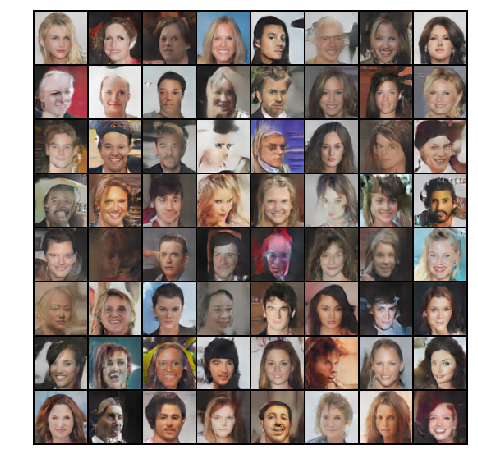

In [20]:
fig = plt.figure(figsize = (8,8))
plt.axis('off')
ims = [[plt.imshow(np.transpose(i, (1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [21]:
real_batch = next(iter(dataloader))

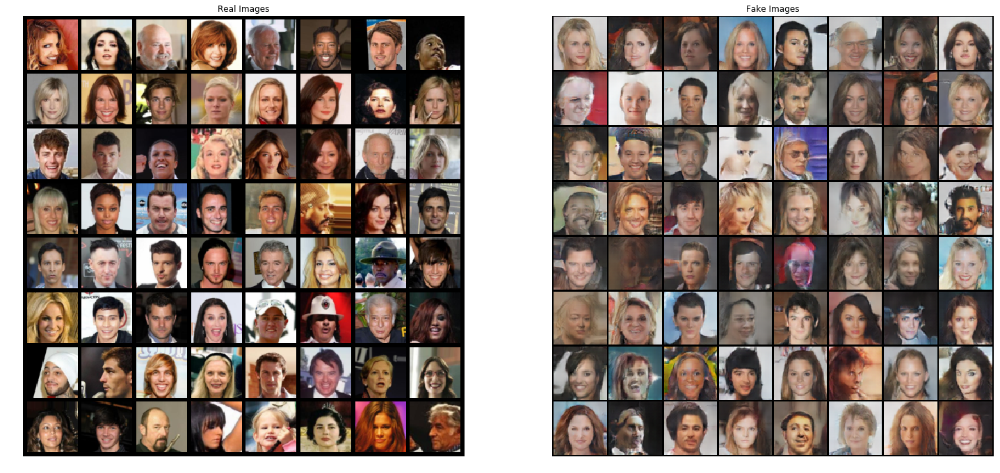

In [27]:
plt.figure(figsize=(25,25))
plt.subplot(1,2,1)
plt.axis('off')
plt.title('Real Images')
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5,
                                        normalize=True).cpu(),(1,2,0)))
plt.subplot(1,2,2)
plt.axis('off')
plt.title('Fake Images')
plt.imshow(np.transpose(img_list[-1],(1,2,0)))

In [92]:
img = np.load('img_minibach_feature.npy')

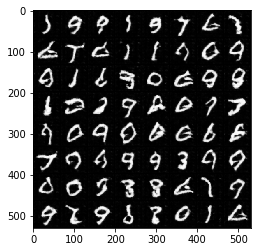

In [93]:
plt.imshow(img[-1])

In [53]:
def log_sum_exp(x, axis = 1):
    m = torch.max(x, dim = 1)[0]
    return m + torch.log(torch.sum(torch.exp(x - m.unsqueeze(1)), dim = axis))

In [47]:
a = torch.randn([10,5])

In [51]:
torch.logsumexp(a, 1)

tensor([2.2400, 2.3838, 2.5134, 1.4598, 1.9979, 1.7503, 2.1071, 2.6521, 2.6110,
        3.1397])

In [54]:
log_sum_exp(a, 1)

tensor([2.2400, 2.3838, 2.5134, 1.4598, 1.9979, 1.7503, 2.1071, 2.6521, 2.6110,
        3.1397])

In [81]:
_, b = torch.max(a,1)

In [82]:
b

tensor([1, 1, 1, 4, 3, 2, 3, 0, 2, 4])

In [83]:
a

tensor([[-0.2528,  1.4072,  0.2910,  1.0365, -0.9816],
        [-3.4219,  1.4910,  0.2422,  1.4832, -0.3704],
        [ 0.0941,  2.1528,  0.6271, -1.1666, -0.7862],
        [ 0.0759, -0.0086, -0.6568, -1.0011,  0.2992],
        [ 0.6396, -1.0857, -1.6153,  1.5635, -1.7952],
        [ 0.6095, -0.7203,  0.6119,  0.3259, -1.6059],
        [-0.5272,  0.3401, -1.3832,  1.1149,  1.0747],
        [ 1.7402,  0.0857,  0.3394,  0.9895,  1.1944],
        [-0.4303,  0.3703,  1.9198,  1.3003,  0.0243],
        [ 0.3856,  1.4924, -0.9468,  1.8339,  2.3544]])